In [ ]:
import csv
from datetime import datetime
import json
import math
import os
import sys
import time
import numpy as np
import torch
import torch.nn as nn
from torch import Tensor
from torch.nn import (TransformerDecoder, TransformerDecoderLayer, TransformerEncoder, TransformerEncoderLayer)
from torch.utils.data import DataLoader
from tqdm import tqdm

In [ ]:
try:
  from google.colab import drive
  IS_GOOGLE_COLAB = True
except ImportError:
  IS_GOOGLE_COLAB = False

if IS_GOOGLE_COLAB:
  mount_path='/content/drive'
  base_folder = "/Data/FX"
  data_folder = f'{mount_path}/My Drive{base_folder}'
  drive.mount(mount_path)
else:
  base_folder = '../../../Data/'
  data_folder = base_folder

Mounted at /content/drive


In [ ]:
if IS_GOOGLE_COLAB:
    module_path = os.path.abspath(f"{mount_path}/My Drive/modules")
    sys.path.append(module_path)
    import fprocess
else:
    module_path = os.path.abspath("../..")
    sys.path.append(module_path)
    from fprocess import fprocess

In [ ]:
import os
import pandas as pd

ohlc_column = ['open','high','low','close']
file_name = f"mt5_USDJPY_min30.zip"

file_path = os.path.join(data_folder, file_name)
file_path = os.path.abspath(file_path)
df = pd.read_csv(file_path, parse_dates=True, index_col=0)
df

,open,high,low,close,tick_volume,spread,real_volume
time,,,,,,,
2014-07-07 08:30:00,102.086,102.122,102.081,102.102,738,3,0
2014-07-07 09:00:00,102.102,102.146,102.098,102.113,1036,3,0
2014-07-07 09:30:00,102.113,102.115,102.042,102.044,865,3,0
2014-07-07 10:00:00,102.047,102.052,102.005,102.019,983,3,0
2014-07-07 10:30:00,102.017,102.025,101.918,101.941,1328,3,0
...,...,...,...,...,...,...,...
2022-08-12 21:30:00,133.461,133.506,133.439,133.484,1125,3,0
2022-08-12 22:00:00,133.484,133.530,133.437,133.475,1277,3,0
2022-08-12 22:30:00,133.475,133.486,133.433,133.483,1506,3,0


array([[<Axes: title={'center': 'open'}>,
        <Axes: title={'center': 'high'}>],
       [<Axes: title={'center': 'low'}>,
        <Axes: title={'center': 'close'}>]], dtype=object)

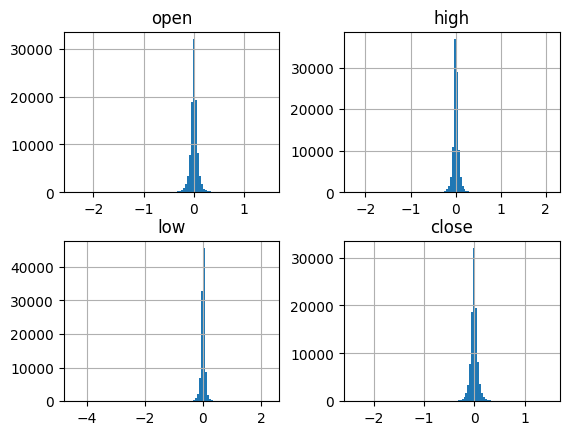

In [ ]:
df[ohlc_column].diff().hist(bins=100)

## Confirm diff token with minmax

In [ ]:
columns = ohlc_column

diff_p = fprocess.DiffPreProcess(columns=ohlc_column)
ohlc_pre_process = [diff_p]

standalization_p = fprocess.MinMaxPreProcess(columns=ohlc_column)
processes = [*ohlc_pre_process, standalization_p]

In [ ]:
src_df = df[["open", "high", "low", "close"]].copy()

for process in processes:
  src_df = process(src_df)

In [ ]:
src_df

,low,close,high,open
time,,,,
2014-07-07 08:30:00,NaN,NaN,NaN,NaN
2014-07-07 09:00:00,0.325819,0.235701,0.050380,0.237949
2014-07-07 09:30:00,0.304167,0.194665,0.025075,0.235385
2014-07-07 10:00:00,0.309803,0.217235,0.010352,0.195897
2014-07-07 10:30:00,0.294973,0.190049,0.026915,0.214359
...,...,...,...,...
2022-08-12 21:30:00,0.321667,0.241857,0.037037,0.217949
2022-08-12 22:00:00,0.320184,0.225442,0.050380,0.241538
2022-08-12 22:30:00,0.319591,0.234163,0.019094,0.225128


array([[<Axes: title={'center': 'low'}>,
        <Axes: title={'center': 'close'}>],
       [<Axes: title={'center': 'open'}>,
        <Axes: title={'center': 'high'}>]], dtype=object)

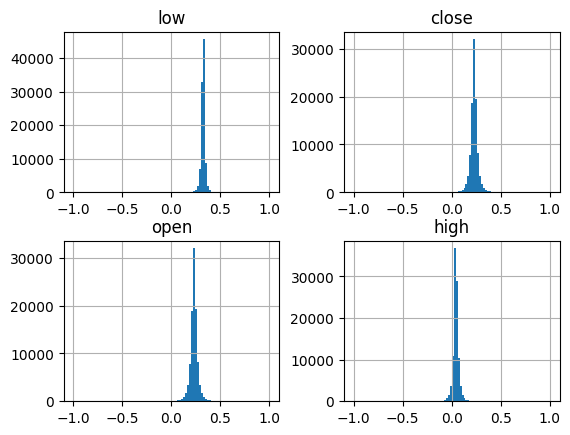

In [ ]:
src_df.hist(bins=100)

In [ ]:
print('skew:', src_df.skew().values)
print('kurt:', src_df.kurtosis().values)

skew: [-4.76680581 -1.10316985 -1.08251622  0.1698781 ]
kurt: [212.82098174  41.8575681   41.72337237  46.36204226]


In [ ]:
import random

indices = random.choices(range(1, len(src_df)), k=3000)
indices.sort()
src_df_lim = src_df.iloc[indices].copy()

In [ ]:
cos = nn.CosineSimilarity(dim=1)
similarities = []
input2 = torch.tensor(src_df_lim.values)

for index in range(1, len(src_df_lim)):
  input1 = torch.tensor(src_df_lim.iloc[index: index+1].values)
  output = cos(input1, input2)
  similarity = output.cpu().detach().numpy()
  similarities.append(similarity)

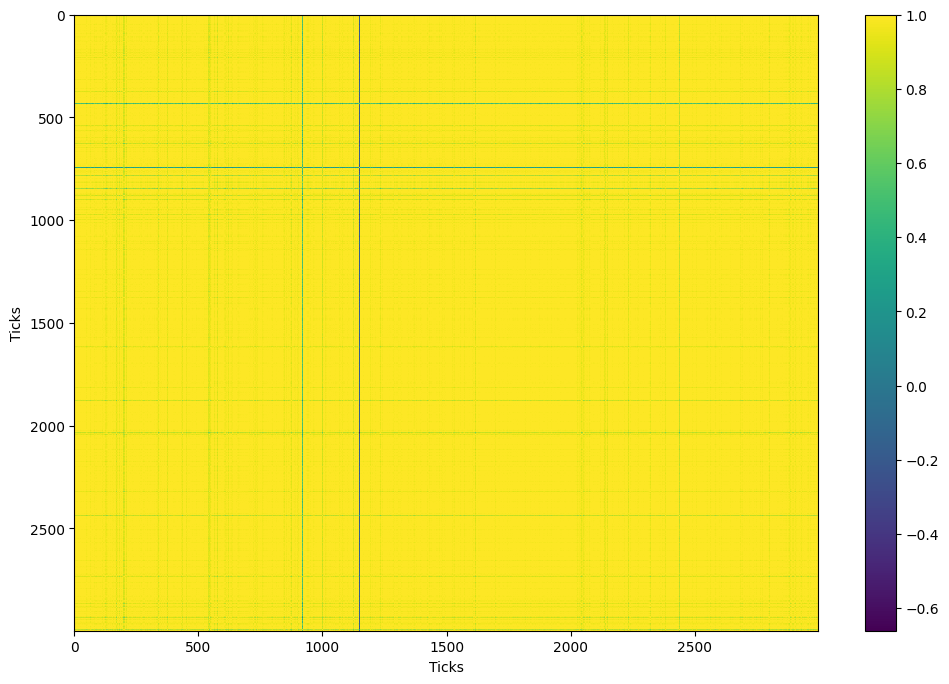

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('Ticks')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('Ticks')
plt.colorbar()
plt.show()

<Axes: >

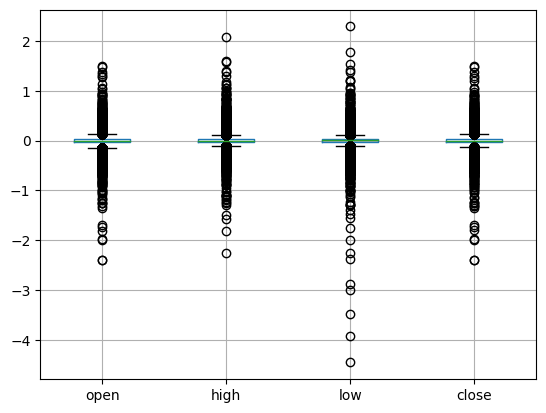

In [ ]:
df[["open", "high", "low", "close"]].diff().boxplot()

<Axes: >

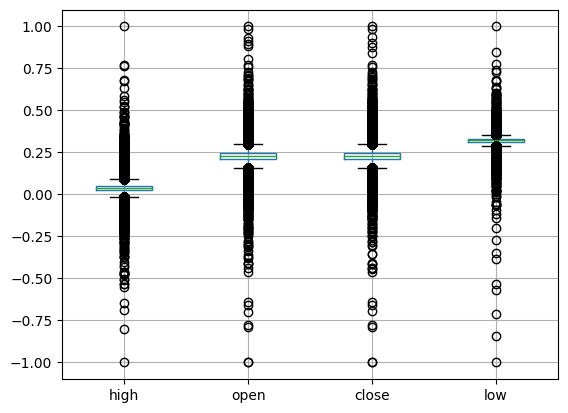

In [ ]:
src_df.boxplot()

In [ ]:
import datetime

start_date = src_df.index[1]
start_date = datetime.datetime(start_date.year, start_date.month, start_date.day)
delta = datetime.timedelta(days=1)
end_date = start_date + delta

<Axes: >

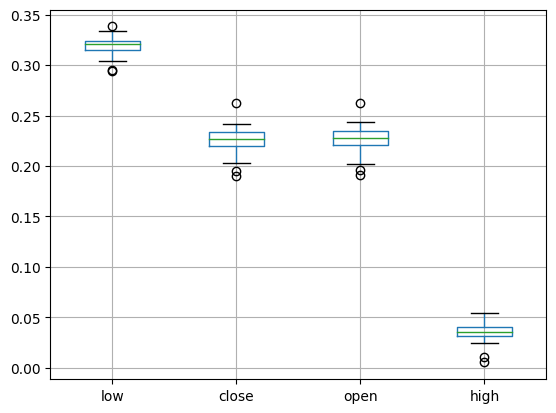

In [ ]:
one_day_df = src_df[(src_df.index >= start_date) & (src_df.index < end_date)]
one_day_df.boxplot()

<Axes: >

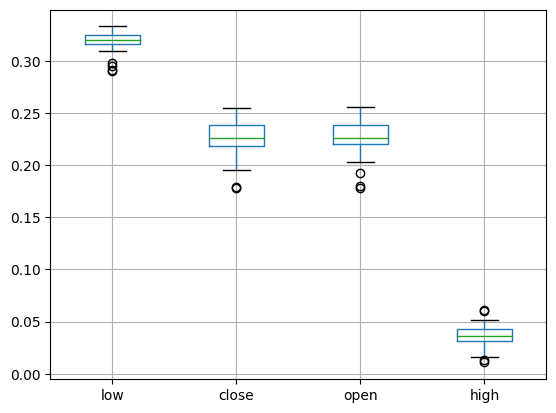

In [ ]:
start_date = end_date
end_date = start_date + delta

one_day_df = src_df[(src_df.index >= start_date) & (src_df.index < end_date)]
one_day_df.boxplot()

In [ ]:
import datetime

start_date = src_df.index[1]
start_date = datetime.datetime(start_date.year, start_date.month, 1)
if start_date.month < 12:
  year = start_date.year
  month = start_date.month + 1
else:
  year = start_date.year + 1
  month = 1

end_date = datetime.datetime(year, month, 1)
last_date = src_df.index[-1]

<Axes: >

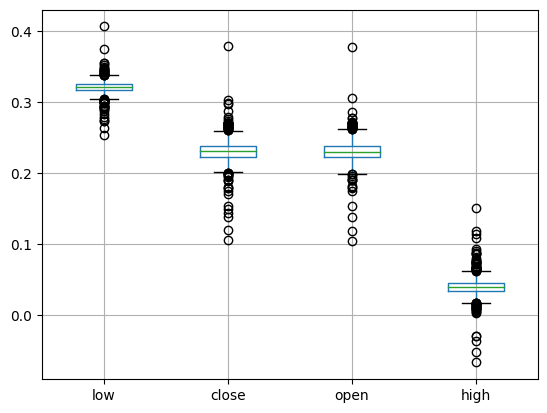

In [ ]:
one_month_df = src_df[(src_df.index >= start_date) & (src_df.index < end_date)]
one_month_df.boxplot()

[]

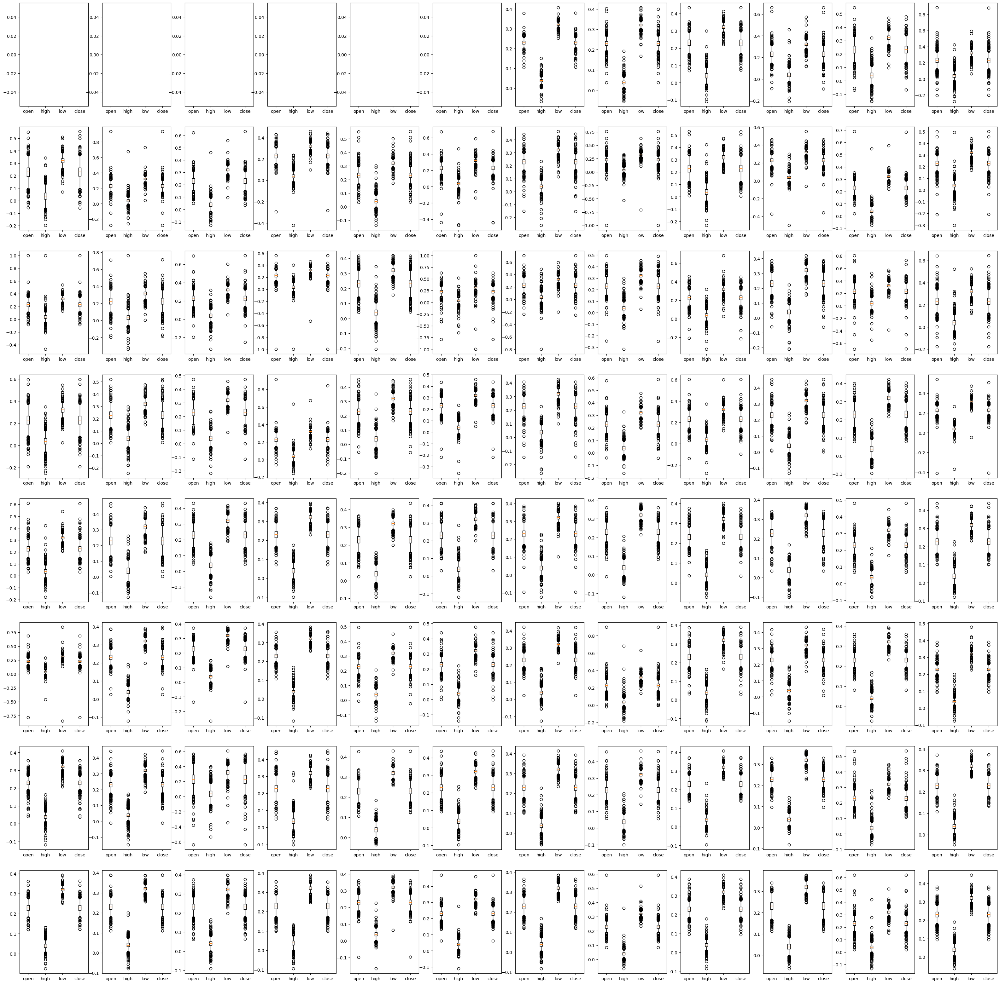

In [ ]:
import matplotlib.pyplot as plt

initial_year = start_date.year
num_of_years = last_date.year - start_date.year
fig, axs = plt.subplots(num_of_years, 12, figsize=(40, 5*num_of_years))

for y_index in range(0, num_of_years):
  year = initial_year + y_index
  for x_index in range(0, 12):
    month = x_index + 1
    start_date = datetime.datetime(year, month, day=1)
    if month < 12:
      month += 1
    else:
      year += 1
      month = 1

    end_date = datetime.datetime(year, month, 1)
    one_month_df = src_df[(src_df.index >= start_date) & (src_df.index < end_date)]
    for index, column in enumerate(ohlc_column):
      axs[y_index, x_index].boxplot(one_month_df[column].dropna(), positions=[index], labels=[column])
plt.plot()

In [ ]:
import datetime

start_date = src_df.index[1]
start_date = datetime.datetime(start_date.year, 1, 1)
end_date = datetime.datetime(start_date.year + 1, 1, 1)

<Axes: >

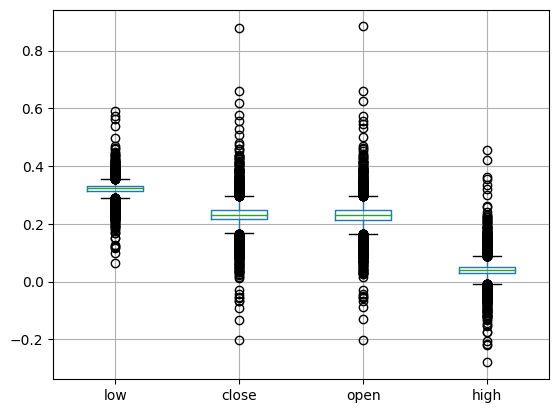

In [ ]:
one_year_df = src_df[(src_df.index >= start_date) & (src_df.index < end_date)]
one_year_df.boxplot()

### Categorize Diff Values

In [ ]:
# Categorize ohlc with row diff

In [ ]:
src_df

,low,open,high,close
time,,,,
2014-07-07 08:30:00,NaN,NaN,NaN,NaN
2014-07-07 09:00:00,0.325819,0.237949,0.050380,0.235701
2014-07-07 09:30:00,0.304167,0.235385,0.025075,0.194665
2014-07-07 10:00:00,0.309803,0.195897,0.010352,0.217235
2014-07-07 10:30:00,0.294973,0.214359,0.026915,0.190049
...,...,...,...,...
2022-08-12 21:30:00,0.321667,0.217949,0.037037,0.241857
2022-08-12 22:00:00,0.320184,0.241538,0.050380,0.225442
2022-08-12 22:30:00,0.319591,0.225128,0.019094,0.234163


In [ ]:
import random

label_num_k = 40
max_iter = 10000
count = 0

tokens_df = src_df.iloc[1:].copy()

labels = np.fromiter(random.choices(range(label_num_k), k=tokens_df.shape[0]), dtype = int)
labels_prev = np.zeros(tokens_df.shape[0])
cluster_centers = np.eye(label_num_k, tokens_df.shape[1])

while (not (labels == labels_prev).all()):
    for i in range(label_num_k):
        clusters = tokens_df.iloc[labels == i, :]
        if len(clusters) > 0:
          cluster_centers[i, :] = clusters.mean(axis = 0)
        else:
          cluster_centers[i, :] = np.ones(tokens_df.shape[1])
    dist = ((tokens_df.values[:, :, np.newaxis] - cluster_centers.T[np.newaxis, :, :]) ** 2).sum(axis = 1)
    # dist = np.sqrt(dist)
    labels_prev = labels
    labels = dist.argmin(axis = 1)
    count += 1
    if count > max_iter:
      print("iteration over the limit")
      break

In [ ]:
count

358

In [ ]:
unique_values, counts = np.unique(labels, return_counts=True)

In [ ]:
counts

array([ 2206,    96,  3600,   744,    72,  7961,   602,  2495,  4180,
        8617,   296,  2236,   346,   155,  3394,  1110,    44,   133,
        6897,  1312,   589,  1337,    21,  6916,    49,    10,  3228,
        4376, 13862,  2012,  3339,  6891,    14,   870,  7561,   514,
         366,   643,   286,  1339])

In [ ]:
len(unique_values) == label_num_k

True

[]

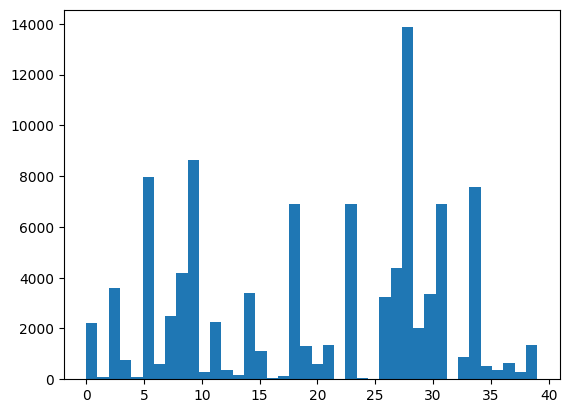

In [ ]:
import matplotlib.pyplot as plt

plt.hist(labels, bins=len(unique_values))
plt.plot()

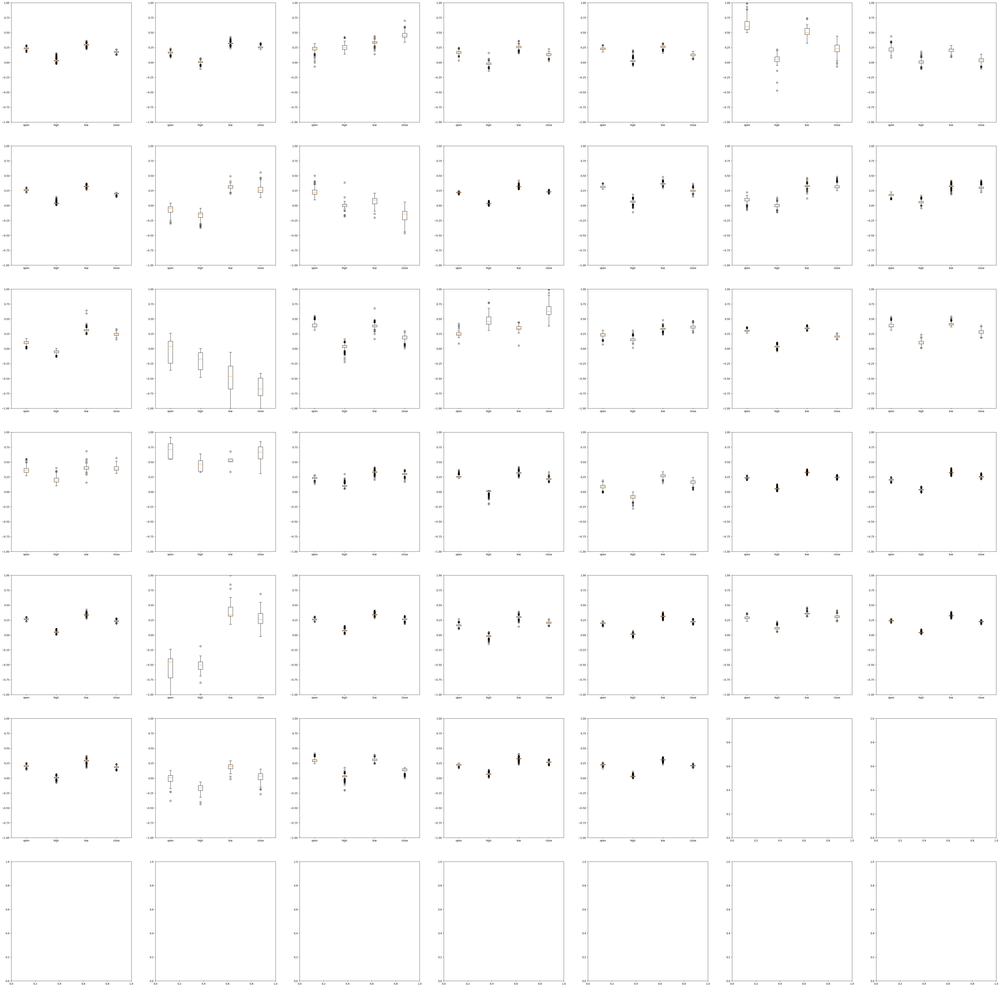

In [ ]:
unit = int(np.ceil(np.sqrt(label_num_k)))
fig, axs = plt.subplots(unit, unit, figsize=(10*unit, 10*unit))

for label in range(0, label_num_k):
  label_values = tokens_df.iloc[labels == label, :]
  x_index = label % unit
  y_index = label // unit

  for index, column in enumerate(ohlc_column):
      axs[y_index, x_index].boxplot(label_values[column].dropna(), positions=[index], labels=[column])
      axs[y_index, x_index].set_ylim(-1, 1)

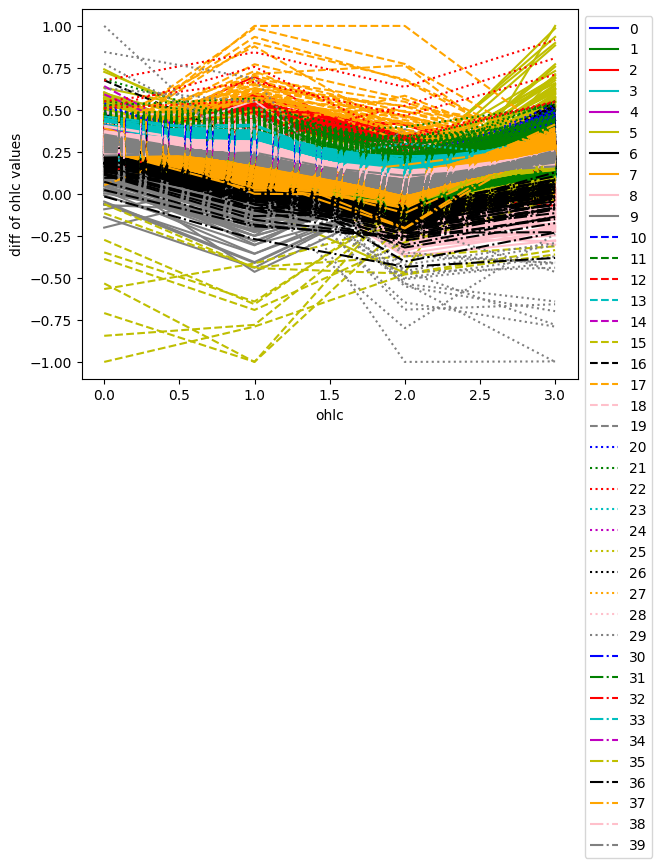

In [ ]:
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'pink', 'gray']
line_styles = ['-', '--', ':', '-.']

if label_num_k > len(colors) * len(line_styles):
  print('lack of line styles')
else:
  for label in range(0, label_num_k):
    label_values = tokens_df.iloc[labels == label, :]
    color_index = label % len(colors)
    style_index = label // len(colors)
    label_values = label_values.dropna().values
    for value in label_values[:-1]:
      plt.plot(value, linestyle=line_styles[style_index], color=colors[color_index])
    # to show label, add label last values only
    plt.plot(label_values[-1], linestyle=line_styles[style_index], color=colors[color_index], label=label)
  plt.xlabel("ohlc")
  plt.ylabel("diff of ohlc values")
  legend = plt.legend(loc='upper left')
  legend.set_bbox_to_anchor((1, 1))
  plt.show()

In [371]:
# minimum count may be not enough to use this categories for Deep Learning
ranking = pd.Series(labels).value_counts()
ranking

28    13862
9      8617
5      7961
34     7561
23     6916
18     6897
31     6891
27     4376
8      4180
2      3600
14     3394
30     3339
26     3228
7      2495
11     2236
0      2206
29     2012
39     1339
21     1337
19     1312
15     1110
33      870
3       744
37      643
6       602
20      589
35      514
36      366
12      346
10      296
38      286
13      155
17      133
1        96
4        72
24       49
16       44
22       21
32       14
25       10
dtype: int64

<Axes: >

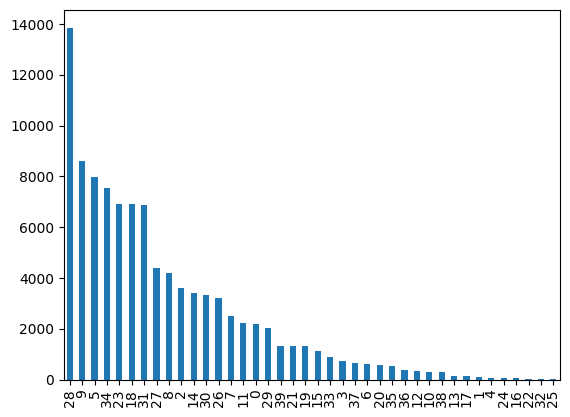

In [ ]:
# k-means shows different result every time.
ranking.plot.bar()

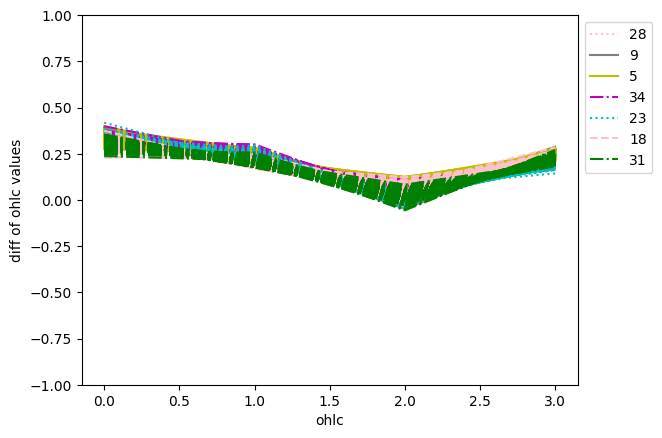

In [ ]:
view_top_n = 7

for label in ranking.index[:view_top_n]:
  label_values = tokens_df.iloc[labels == label, :]
  color_index = label % len(colors)
  style_index = label // len(colors)
  label_values = label_values.dropna().values
  for value in label_values[:-1]:
    plt.plot(value, linestyle=line_styles[style_index], color=colors[color_index])
  # to show label, add label last values only
  plt.plot(label_values[-1], linestyle=line_styles[style_index], color=colors[color_index], label=label)
plt.xlabel("ohlc")
plt.ylabel("diff of ohlc values")
legend = plt.legend(loc='upper left')
legend.set_bbox_to_anchor((1, 1))
plt.ylim(-1, 1)
plt.show()

In [ ]:
probability_df = ranking/ranking.sum()

In [ ]:
distances_with_top = []

for label in ranking.index:
  distance = np.linalg.norm(cluster_centers[ranking.index[0]] - cluster_centers[label])
  distances_with_top.append(distance)

<BarContainer object of 40 artists>

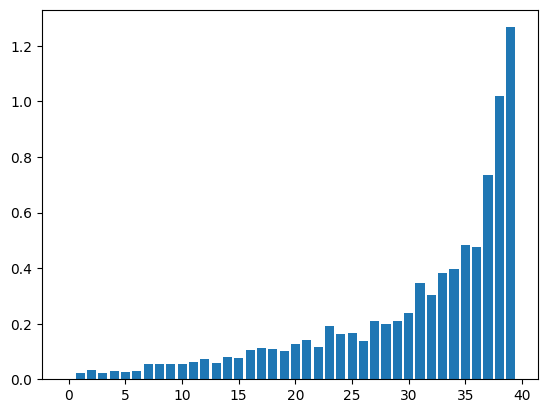

In [ ]:
plt.bar(range(len(ranking)), distances_with_top)

In [ ]:
def cos_sim(v1, v2):
    return np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2))

In [ ]:
similarities_with_top = []

for label in ranking.index:
  distance = cos_sim(cluster_centers[ranking.index[0]], cluster_centers[label])
  similarities_with_top.append(distance)

<BarContainer object of 40 artists>

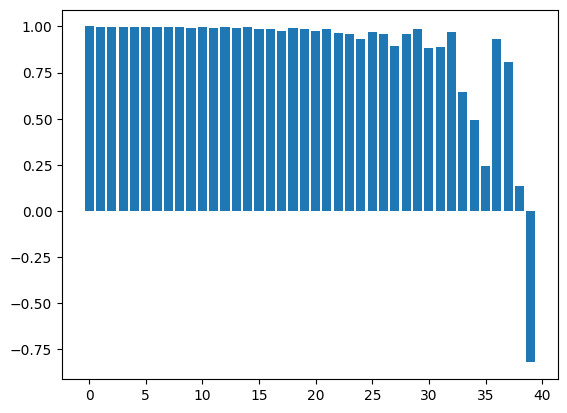

In [ ]:
# sometimes distance differ, but direction is similar
plt.bar(range(len(ranking)), similarities_with_top)

[]

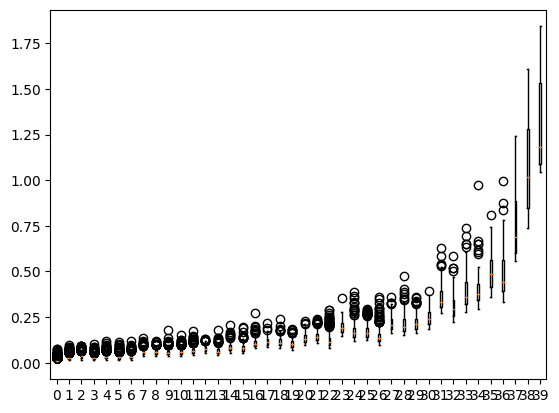

In [ ]:
target_vector = cluster_centers[ranking.index[0]]
for index, ranked_index in enumerate(ranking.index):
  distances = ((tokens_df[labels == ranking.index[index]].values - target_vector)**2).sum(axis=1)
  plt.boxplot(np.sqrt(distances), positions = [index])
plt.plot()

[]

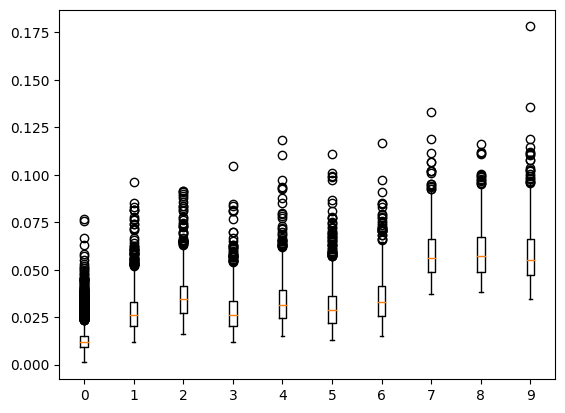

In [ ]:
target_vector = cluster_centers[ranking.index[0]]
for index, ranked_index in enumerate(ranking.index[:10]):
  distances = ((tokens_df[labels == ranking.index[index]].values - target_vector)**2).sum(axis=1)
  plt.boxplot(np.sqrt(distances), positions = [index])
plt.plot()

[]

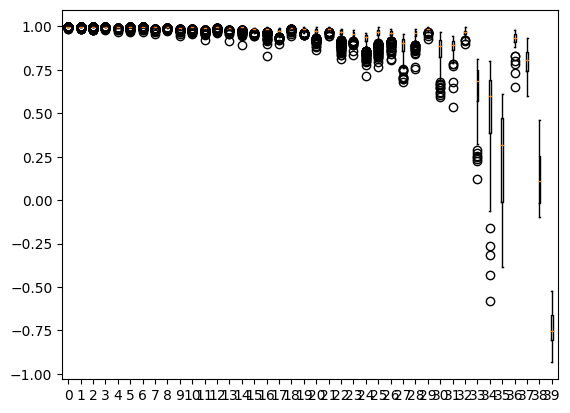

In [ ]:
target_vector = cluster_centers[ranking.index[0]]
for index, ranked_index in enumerate(ranking.index):
  similarities = []
  for values in tokens_df[labels == ranking.index[index]].values:
    similarity = cos_sim(target_vector, values)
    similarities.append(similarity)
  plt.boxplot(similarities, positions = [index])
plt.plot()

[]

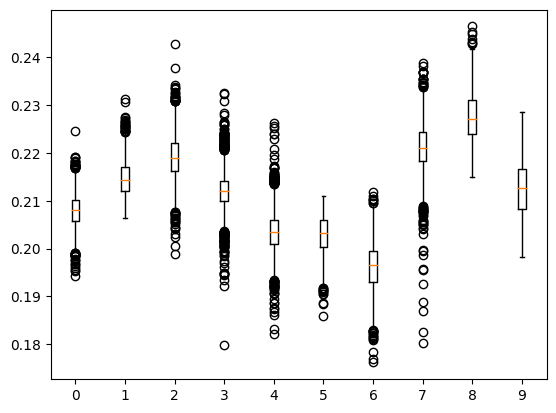

In [ ]:
target_vector = cluster_centers[ranking.index[0]]
for index, ranked_index in enumerate(ranking.index[:10]):
  similarities = []
  for values in tokens_df[labels == ranking.index[index]].values:
    similarity = np.dot(target_vector, values)
    similarities.append(similarity)
  plt.boxplot(similarities, positions = [index])
plt.plot()

[]

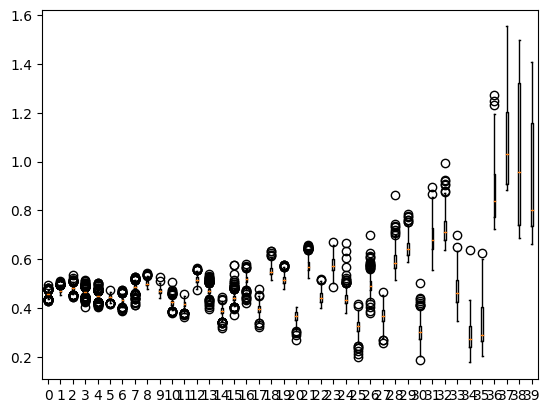

In [ ]:
target_vector = np.zeros(4)
for index, ranked_index in enumerate(ranking.index):
  distances = ((tokens_df[labels == ranking.index[index]].values - target_vector)**2).sum(axis=1)
  plt.boxplot(np.sqrt(distances), positions = [index])
plt.plot()

[]

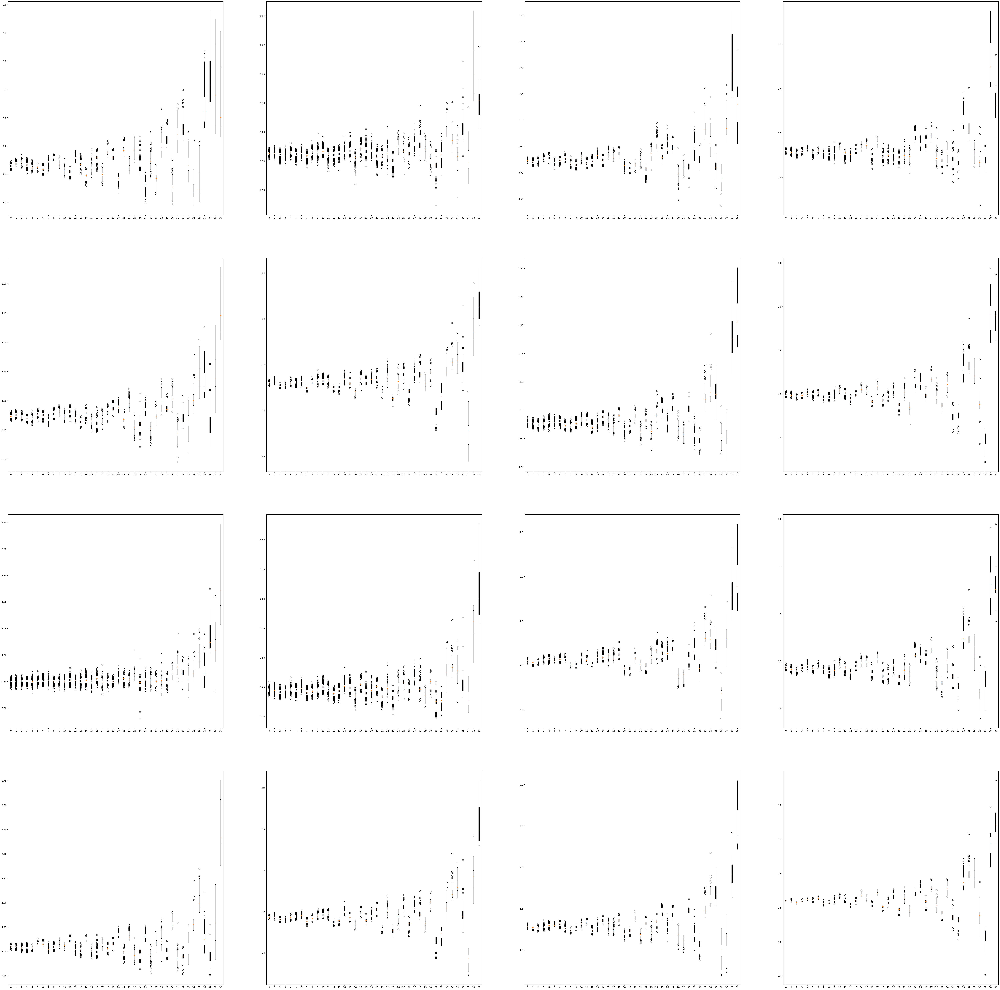

In [ ]:
n = 4
fig, axs = plt.subplots(n, n, figsize=(20*n, 20*n))

values = np.array([0, 1])
grid = np.array(np.meshgrid(*([values]*n))).T.reshape(-1, n)

for index, target_vector in enumerate(grid):
  x_index = index % n
  y_index = index // n
  for position, ranked_index in enumerate(ranking.index):
    distances = ((tokens_df[labels == ranking.index[position]].values - target_vector)**2).sum(axis=1)
    axs[x_index, y_index].boxplot(np.sqrt(distances), positions = [position])
plt.plot()

In [ ]:
# Confirm if the distribution is biased

In [ ]:
probability_df = ranking/ranking.sum()

In [ ]:
indices = np.arange(tokens_df.shape[0])
next_label_indices = indices[labels == ranking.index[0]] + 1

In [ ]:
next_rank_df = pd.Series(labels[next_label_indices]).value_counts()
next_prob_df = next_rank_df/next_rank_df.sum()

In [ ]:
probability_df = pd.concat([probability_df, next_prob_df], axis=1)

<Axes: >

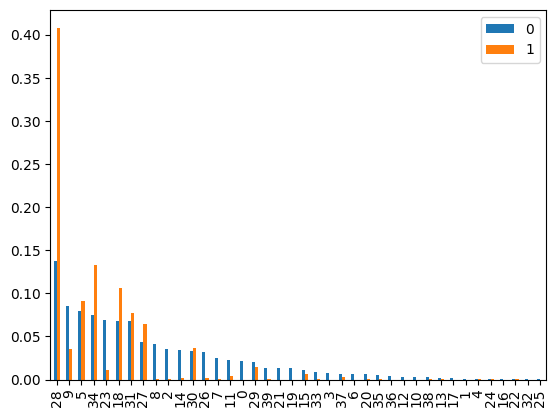

In [372]:
probability_df.plot.bar()

In [373]:
next_label_indices = next_label_indices[labels[next_label_indices] == ranking.index[0]] + 1

<Axes: >

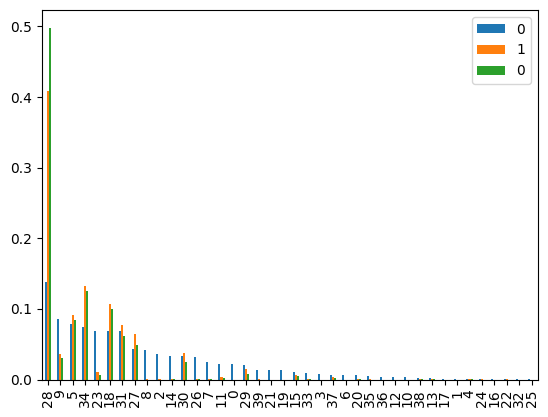

In [374]:
next_rank_df = pd.Series(labels[next_label_indices]).value_counts()
next_prob_df = next_rank_df/next_rank_df.sum()
probability_df = pd.concat([probability_df, next_prob_df], axis=1)
probability_df.plot.bar()

In [368]:
# try bpe
import re, collections

def get_stats(word):
    pairs = collections.defaultdict(int)
    symbols = word.split()
    for i in range(len(symbols)-1):
        pairs[symbols[i],symbols[i+1]] += 1
    return pairs

def merge_vocab(pair, w_in, new_label):
    v_out = {}
    bigram = re.escape(' '.join(pair))
    p = re.compile(r'(?<!\S)' + bigram + r'(?!\S)')
    w_out = p.sub(f"{new_label}", w_in)
    return w_out

word = ""
for label in labels:
  word += f" {str(label)}"
ids = {}

num_merges = len(labels)
min_pair_count = 100
next_label = max(labels) + 1

for i in range(num_merges):
    pairs = get_stats(word)
    if pairs:
      best = max(pairs, key=pairs.get)
      pair_count = pairs[best]

      if pair_count >= min_pair_count:
        word = merge_vocab(best, word, str(next_label))
        ids[next_label] = {"pair": best, "amount": pair_count}
        next_label += 1
      else:
        print(f"pair count is less than the limit: {pair_count}, {best}, {i}")
        break
    else:
      print("no more pairs")
      break

pair count is less than the limit: 99, ('45', '9'), 108


In [369]:
len(word.split())

56335

In [370]:
ids

{40: {'pair': ('28', '28'), 'amount': 5663},
 41: {'pair': ('34', '9'), 'amount': 2517},
 42: {'pair': ('5', '9'), 'amount': 2204},
 43: {'pair': ('18', '23'), 'amount': 2174},
 44: {'pair': ('31', '23'), 'amount': 1637},
 45: {'pair': ('27', '8'), 'amount': 1407},
 46: {'pair': ('34', '5'), 'amount': 1134},
 47: {'pair': ('18', '31'), 'amount': 1008},
 48: {'pair': ('40', '40'), 'amount': 996},
 49: {'pair': ('27', '2'), 'amount': 996},
 50: {'pair': ('30', '0'), 'amount': 863},
 51: {'pair': ('5', '5'), 'amount': 847},
 52: {'pair': ('30', '14'), 'amount': 785},
 53: {'pair': ('7', '8'), 'amount': 764},
 54: {'pair': ('26', '8'), 'amount': 715},
 55: {'pair': ('31', '31'), 'amount': 710},
 56: {'pair': ('26', '2'), 'amount': 707},
 57: {'pair': ('9', '28'), 'amount': 684},
 58: {'pair': ('40', '28'), 'amount': 666},
 59: {'pair': ('29', '19'), 'amount': 568},
 60: {'pair': ('18', '14'), 'amount': 565},
 61: {'pair': ('29', '21'), 'amount': 541},
 62: {'pair': ('7', '2'), 'amount': 53

In [418]:
# Create word by daily or weekly values
label_df = pd.DataFrame(labels, columns=["label"], index=tokens_df.index)
label_df

,label
time,
2014-07-07 09:00:00,5
2014-07-07 09:30:00,18
2014-07-07 10:00:00,14
2014-07-07 10:30:00,31
2014-07-07 11:00:00,14
...,...
2022-08-12 21:30:00,34
2022-08-12 22:00:00,9
2022-08-12 22:30:00,28


In [467]:
label_nan_df = label_df.groupby(pd.Grouper(level=0, freq="30MIN")).first()
label_nan_df

,label
time,
2014-07-07 09:00:00,5.0
2014-07-07 09:30:00,18.0
2014-07-07 10:00:00,14.0
2014-07-07 10:30:00,31.0
2014-07-07 11:00:00,14.0
...,...
2022-08-12 21:30:00,34.0
2022-08-12 22:00:00,9.0
2022-08-12 22:30:00,28.0


In [ ]:
delta = datetime.timedelta(minutes=30)
nan_indices = label_nan_df[label_nan_df.isnull().any(axis=1)].index
close_time_sample = nan_indices[0] - delta

In [434]:
next_time = close_time_sample + delta
while next_time in nan_indices:
  next_time += delta
open_time_sample = next_time

In [435]:
open_weekday = open_time_sample.weekday()
open_hour = open_time_sample.hour
open_minutes = open_time_sample.minute

close_weekday = close_time_sample.weekday()
close_hour = close_time_sample.hour
close_minutes = close_time_sample.minute

In [481]:
import datetime

freq_mins = 30
delta = datetime.timedelta(days=1)

start_date = tokens_df.index[0]
start_date = datetime.datetime(start_date.year, start_date.month, start_date.day, open_hour, open_minutes) + delta
end_date = start_date + delta
last_date = tokens_df.index[-1]
hodilday_label = max(labels) + 1

expected_length = int(delta.total_seconds()/(60*freq_mins))
holiday_token = np.array([ hodilday_label for i in range(expected_length)])

In [482]:
day_tokens = []

while end_date < last_date:
  one_day_df = label_nan_df[(label_nan_df.index >= start_date) & (label_nan_df.index < end_date)]
  if len(one_day_df) > 0:
    one_day_df = one_day_df.fillna(hodilday_label)
    if len(one_day_df) != expected_length:
      print(f"data would be missing on {start_date}")
      continue
    day_token = one_day_df.values.T[0]
    day_tokens.append(day_token)
  else: #if one_day_df.isnull().all().any():
    #market holiday
    day_tokens.append(holiday_token)
  start_date = end_date
  end_date += delta
day_tokens = np.array(day_tokens)

In [464]:
len(day_tokens)

2957

In [466]:
day_tokens[0]

array([28., 28., 31., 28., 30.,  0.,  9.,  5.,  9., 28., 28.,  5.,  9.,
       28., 31., 34.,  5., 28., 18., 23., 18., 31., 23.,  9., 28.,  9.,
       34., 28., 28., 31., 31., 11., 14., 28., 18., 34.,  5.,  9., 28.,
        9., 28., 28., 34., 28., 34.,  5., 28., 28.])

In [475]:
def day_token_to_word(day_token):
  word = ""
  for label in day_token:
    word += f" {str(int(label))}"
  return word

In [483]:
vocab = {}

for day_token in day_tokens:
  word = day_token_to_word(day_token)
  if word in vocab:
    vocab[word] += 1
  else:
    vocab[word] = 1

In [485]:
for key, value in vocab.items():
  if value > 1:
    print(f"{key}: {value}")

 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40: 856


In [488]:
import re, collections

def get_stats(vocab):
    pairs = collections.defaultdict(int)
    for word, freq in vocab.items():
        symbols = word.split()
        for i in range(len(symbols)-1):
            pairs[symbols[i],symbols[i+1]] += freq
    return pairs

def merge_vocab(pair, v_in):
    v_out = {}
    bigram = re.escape(' '.join(pair))
    p = re.compile(r'(?<!\S)' + bigram + r'(?!\S)')
    for word in v_in:
        w_out = p.sub(''.join(pair), word)
        v_out[w_out] = v_in[word]
    return v_out


num_merges = 1000
min_pair_count = 100
additional_vocab = {}

for i in range(num_merges):
    pairs = get_stats(vocab)
    if pairs:
      best = max(pairs, key=pairs.get)
      pair_count = pairs[best]

      if pair_count >= min_pair_count:
        vocab = merge_vocab(best, vocab)
        additional_vocab[best] = pair_count
      else:
        print(f"pair count is less than the limit: {pair_count}, {best}, {i}")
        break
    else:
      print("no more pairs")
      break

pair count is less than the limit: 99, ('38', '36'), 100


In [489]:
additional_vocab

{('27', '8'): 1390,
 ('34', '5'): 1137,
 ('18', '31'): 998,
 ('27', '2'): 986,
 ('2828', '2828'): 888,
 ('4040404040404040404040404040404040404040404040404040404040404040',
  '40404040404040404040404040404040'): 856,
 ('5', '5'): 853,
 ('30', '0'): 835,
 ('30', '14'): 772,
 ('7', '8'): 762,
 ('9', '28'): 712,
 ('31', '31'): 710,
 ('26', '8'): 709,
 ('26', '2'): 703,
 ('2828', '28'): 656,
 ('29', '19'): 563,
 ('29', '21'): 540,
 ('18', '14'): 535,
 ('7', '2'): 528,
 ('18', '34'): 495,
 ('349', '28'): 488,
 ('59', '28'): 467,
 ('11', '0'): 463,
 ('27', '9'): 452,
 ('31', '34'): 438,
 ('11', '14'): 435,
 ('28', '34'): 398,
 ('23', '9'): 385,
 ('23', '5'): 363,
 ('28', '5'): 354,
 ('26', '9'): 351,
 ('15', '39'): 334,
 ('18', '3123'): 316,
 ('29', '8'): 316,
 ('30', '39'): 293,
 ('31', '28'): 282,
 ('31', '14'): 279,
 ('2', '23'): 279,
 ('15', '6'): 278,
 ('27', '26'): 262,
 ('1823', '28'): 261,
 ('30', '23'): 250,
 ('18', '28'): 239,
 ('18', '349'): 237,
 ('33', '19'): 234,
 ('5', '28'): 

In [491]:
len(additional_vocab)

100

In [474]:
# Categorize ohlc with daily aspects

In [ ]:
import datetime
start_date = src_df.index[1]
start_date = datetime.datetime(start_date.year, start_date.month, start_date.day)
delta = datetime.timedelta(days=1)
end_date = start_date + delta
last_date = src_df.index[-1]

In [ ]:
tokens = []
while end_date < last_date:
  one_day_df = src_df[(src_df.index >= start_date) & (src_df.index < end_date)].dropna()
  if len(one_day_df) > 0:
    day_token = one_day_df.mean().values
    tokens.append(day_token)
  else:
    #market holiday
    pass
  start_date = end_date
  end_date += delta
tokens = np.array(tokens)

In [ ]:
cos = nn.CosineSimilarity(dim=1)
similarities = []

input2 = torch.tensor(tokens)
for token in tokens:
  input1 = torch.tensor([token])
  output = cos(input1, input2)
  similarity = output.cpu().detach().numpy()
  similarities.append(similarity)

<ipython-input-10-6167f0185675>:6: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:261.)
  input1 = torch.tensor([token])


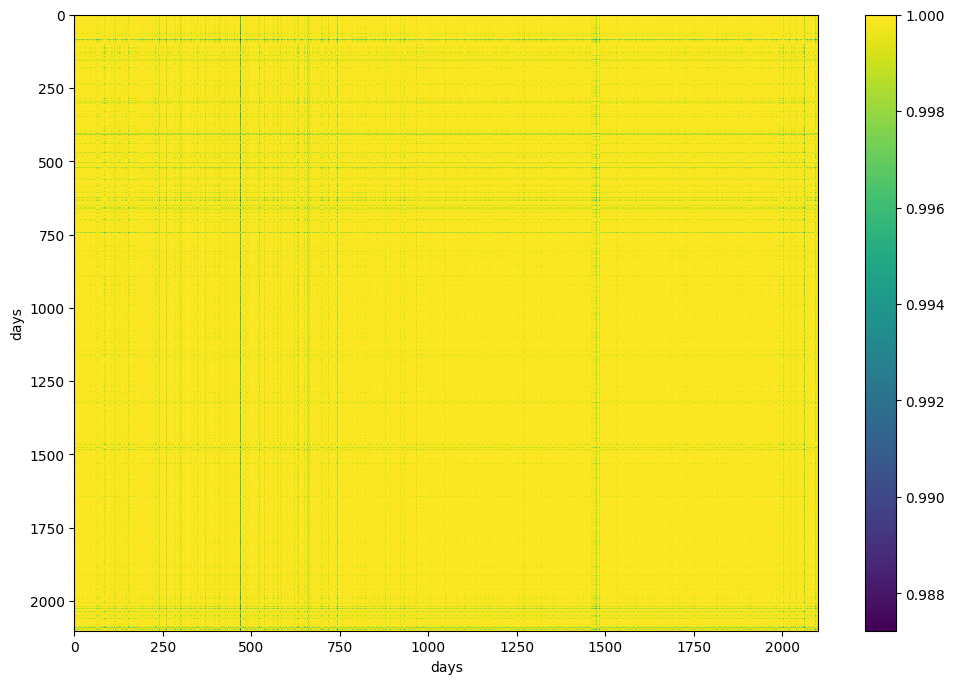

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('days')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('days')
plt.colorbar()
plt.show()

In [ ]:
import datetime
start_date = src_df.index[1]
start_date = datetime.datetime(start_date.year, start_date.month, start_date.day)
delta = datetime.timedelta(days=1)
end_date = start_date + delta
last_date = src_df.index[-1]

In [ ]:
tokens = []
days_of_tokens = []
while end_date < last_date:
  one_day_df = src_df[(src_df.index >= start_date) & (src_df.index < end_date)].dropna()
  if len(one_day_df) > 0:
    day_token = np.append(one_day_df.quantile(0.25).values, one_day_df.quantile(0.75).values)
    tokens.append(day_token)
    days_of_tokens.append(start_date)
  else:
    #market holiday
    pass
  start_date = end_date
  end_date += delta
tokens = np.array(tokens)

In [ ]:
cos = nn.CosineSimilarity(dim=1)
similarities = []

input2 = torch.tensor(tokens)
for token in tokens:
  input1 = torch.tensor([token])
  output = cos(input1, input2)
  similarity = output.cpu().detach().numpy()
  similarities.append(similarity)

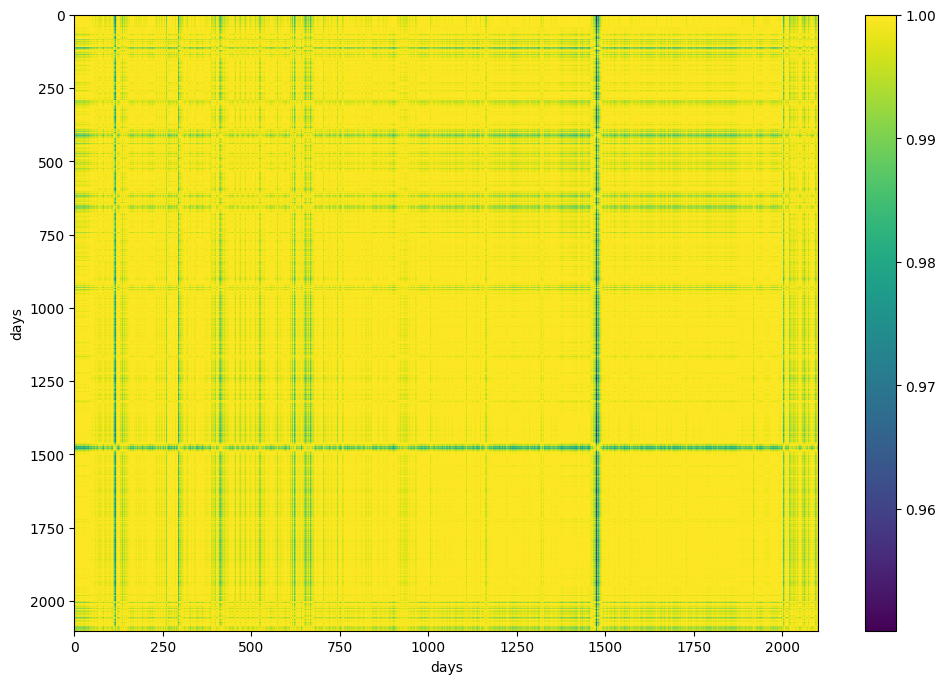

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('days')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('days')
plt.colorbar()
plt.show()

In [ ]:
import random

rand_index = random.randint(0, len(tokens))

np.dot(tokens[rand_index], tokens[0])

0.42896272113988915

In [ ]:
tokens.shape

(2102, 8)

In [ ]:
label_num_k = 10
max_iter = 10000
count = 0

labels = np.fromiter(random.choices(range(label_num_k), k=tokens.shape[0]), dtype = int)
labels_prev = np.zeros(tokens.shape[0])
cluster_centers = np.zeros((label_num_k, tokens.shape[1]))

while (not (labels == labels_prev).all() and count < max_iter):
    for i in range(label_num_k):
        clusters = tokens[labels == i, :]
        if len(clusters) > 0:
          cluster_centers[i, :] = clusters.mean(axis = 0)
        else:
          cluster_centers[i, :] = np.NaN
    dist = ((tokens[:, :, np.newaxis] - cluster_centers.T[np.newaxis, :, :]) ** 2).sum(axis = 1)
    labels_prev = labels
    labels = dist.argmin(axis = 1)
    count += 1

(array([318.,  18., 146., 521., 119.,  40.,  55., 185., 385., 315.]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <BarContainer object of 10 artists>)

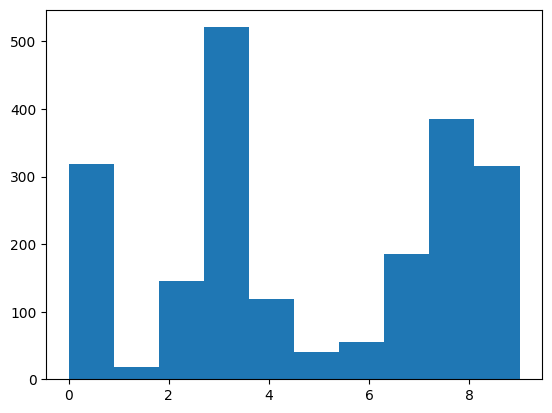

In [ ]:
import matplotlib.pyplot as plt

plt.hist(labels, bins=label_num_k)

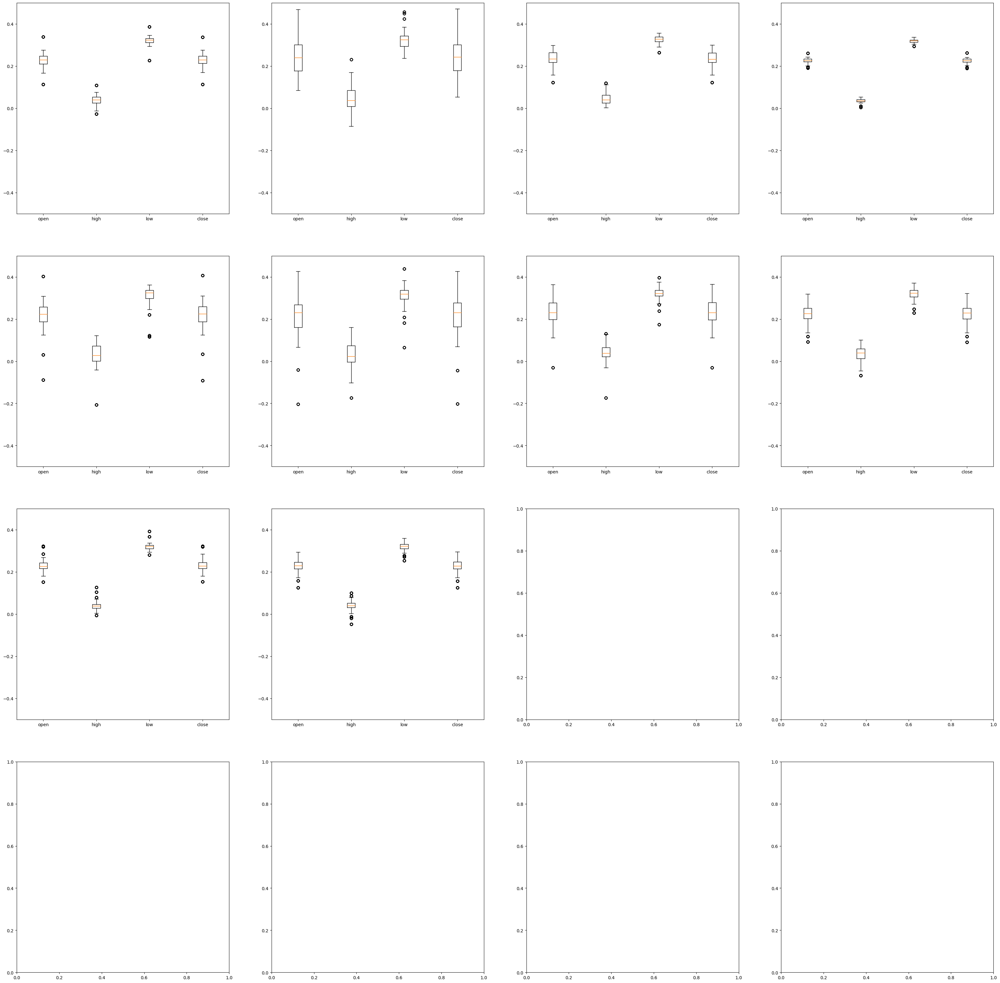

In [ ]:
days_of_tokens = np.array(days_of_tokens)
unit = int(np.ceil(np.sqrt(label_num_k)))
fig, axs = plt.subplots(unit, unit, figsize=(10*unit, 10*unit))

for label in range(0, label_num_k):
  label_days = days_of_tokens[labels == label]
  x_index = label % unit
  y_index = label // unit
  label_values = None

  for start_date in label_days:
    start_date = label_days[0]
    end_date = start_date + delta
    token = src_df[(src_df.index >= start_date) & (src_df.index < end_date)]
    if label_values is None:
      label_values = token
    else:
      label_values = pd.concat([label_values, token])

  for index, column in enumerate(ohlc_column):
      axs[y_index, x_index].boxplot(label_values[column].dropna(), positions=[index], labels=[column])
      axs[y_index, x_index].set_ylim(-0.5, 0.5)

### Filter observations that have outliers in it

In [ ]:
target_columns = ["open","high", "low", "close"]

# create condition_df
def anomary_index(df, target_columns, alpha = 3):
    target_df = df[target_columns].diff()
    stats_df = target_df.describe()
    condition_df = pd.DataFrame()

    condition_df["upper"] = stats_df.loc["mean"] + stats_df.loc["std"] * alpha
    condition_df["lower"] = stats_df.loc["mean"] - stats_df.loc["std"] * alpha
    match_df = target_df[(target_df >= condition_df["upper"]) | (target_df <= condition_df["lower"])].dropna(how="all")
    return match_df.index

filter_index = anomary_index(df, target_columns, 3)
len(filter_index)

3954

In [ ]:
target_columns = ["open","high", "low", "close"]

# function to remove values if observation or target has anomary value
def common_index(df, target_columns, observation_length, prediction_length, alpha = 3):
    target_df = df[target_columns].diff()
    stats_df = target_df.describe()
    condition_df = pd.DataFrame()

    condition_df["upper"] = stats_df.loc["mean"] + stats_df.loc["std"] * alpha
    condition_df["lower"] = stats_df.loc["mean"] - stats_df.loc["std"] * alpha
    match_df = target_df[(target_df < condition_df["upper"]) & (target_df > condition_df["lower"])]
    data_length = observation_length + prediction_length

    valid_indices = []
    for index in range(data_length, len(match_df)):
        train_data = match_df.iloc[index - data_length:index]
        if train_data.isnull().any().any():
            continue
        valid_indices.append(index)
    return valid_indices

train_data_index = common_index(df, target_columns, 60, 10, 3)

In [ ]:
df.iloc[train_data_index]

,open,high,low,close,tick_volume,spread,real_volume
time,,,,,,,
2014-07-08 20:00:00,101.551,101.554,101.529,101.541,594,3,0
2014-07-08 20:30:00,101.545,101.550,101.529,101.532,546,3,0
2014-07-08 21:00:00,101.533,101.558,101.532,101.552,512,3,0
2014-07-08 21:30:00,101.551,101.551,101.516,101.538,550,3,0
2014-07-08 22:00:00,101.536,101.567,101.533,101.556,373,3,0
...,...,...,...,...,...,...,...
2022-08-10 13:30:00,134.955,135.013,134.930,134.974,2988,3,0
2022-08-10 14:00:00,134.974,135.032,134.940,134.983,3249,4,0
2022-08-10 14:30:00,134.982,135.014,134.801,134.815,4053,4,0


In [ ]:
#volume_column = ["tick_volume"]
#columns = ohlc_column+volume_column
columns = ohlc_column

#log_p = fprocess.LogPreProcess(columns=ohlc_column)
diff_p = fprocess.DiffPreProcess(columns=ohlc_column)
ohlc_pre_process = [diff_p]

standalization_p = fprocess.MinMaxPreProcess(columns=columns)
processes = [*ohlc_pre_process, standalization_p]

In [ ]:
src_df = df[["open", "high", "low", "close"]].iloc[train_data_index].copy()

for process in processes:
  src_df = process(src_df)

array([[<Axes: title={'center': 'low'}>,
        <Axes: title={'center': 'close'}>],
       [<Axes: title={'center': 'open'}>,
        <Axes: title={'center': 'high'}>]], dtype=object)

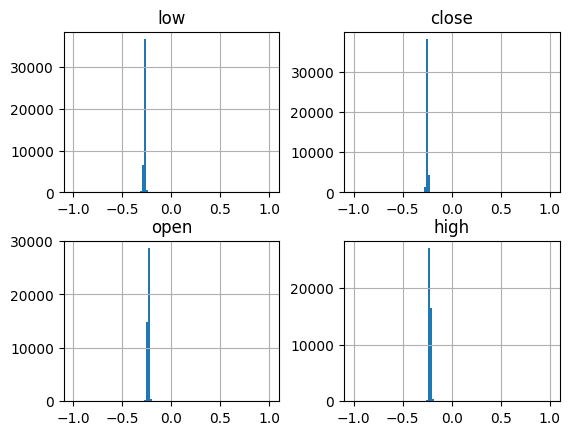

In [ ]:
src_df.hist(bins=100)

<Axes: >

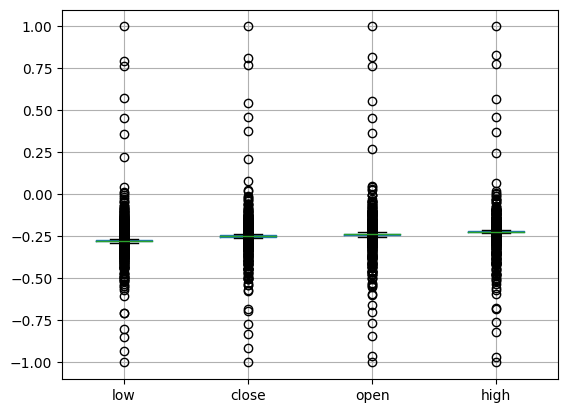

In [ ]:
# alpha=3
src_df.boxplot()

<Axes: >

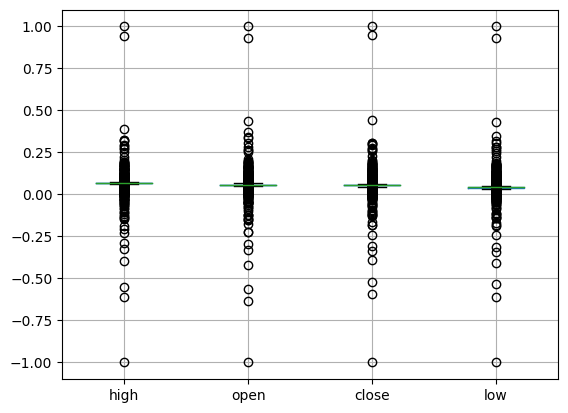

In [ ]:
# alpha=2
src_df.boxplot()

<Axes: >

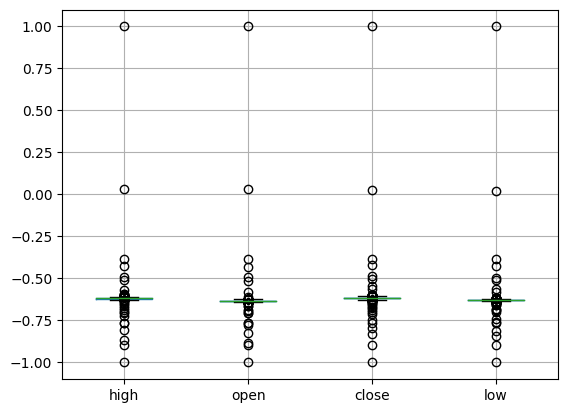

In [ ]:
# alpha=1
src_df.boxplot()

<Axes: >

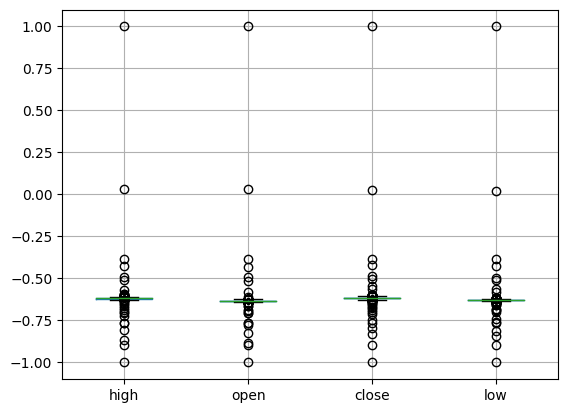

In [ ]:
# alpha=0.5
src_df.boxplot()

In [ ]:
df.diff().describe()

,open,high,low,close,volume
count,275521.000000,275521.000000,275521.000000,275521.000000,275521.0
mean,0.000089,0.000089,0.000089,0.000089,0.0
std,0.097029,0.090851,0.094968,0.096889,0.0
min,-3.511000,-5.110000,-4.417000,-3.518000,0.0
25%,-0.040000,-0.033000,-0.030000,-0.040000,0.0
50%,0.000000,-0.001000,0.004000,0.000000,0.0
75%,0.040000,0.030000,0.039000,0.040000,0.0
max,2.565000,5.070000,2.470000,2.565000,0.0


In [ ]:
import random

indices = random.choices(range(1, len(src_df)), k=3000)
indices.sort()

src_df_lim = src_df.iloc[indices]
cos = nn.CosineSimilarity(dim=1)
similarities = []
input2 = torch.tensor(src_df_lim.values)

for index in range(1, len(src_df_lim)):
  input1 = torch.tensor(src_df_lim.iloc[index: index+1].values)
  output = cos(input1, input2)
  similarity = output.cpu().detach().numpy()
  similarities.append(similarity)

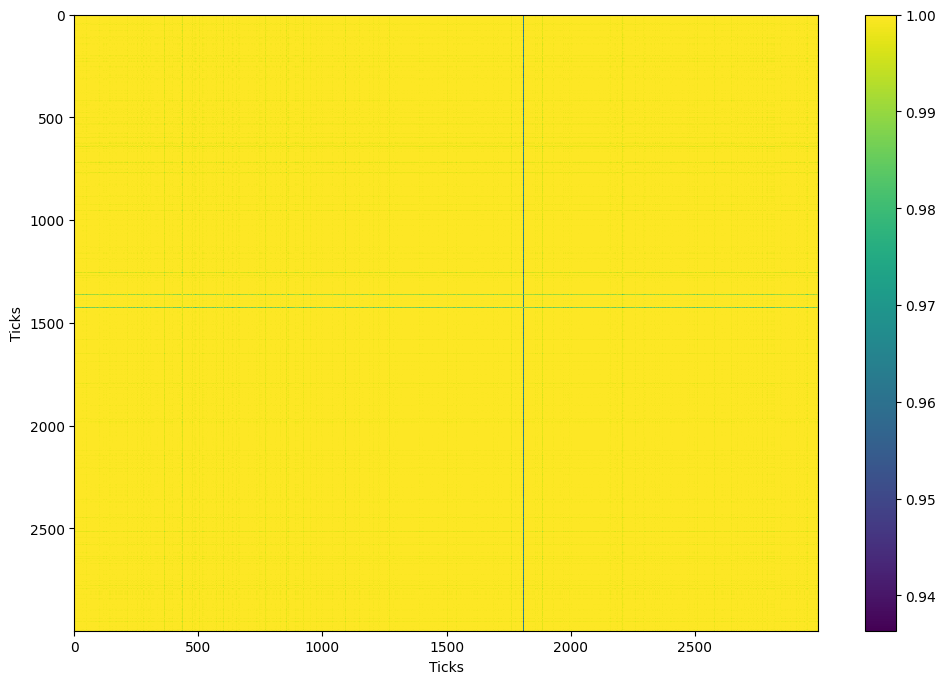

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('Ticks')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('Ticks')
plt.colorbar()
plt.show()

# Removing observations it has outliers is not good.

### Filter outliers only

In [ ]:
target_columns = ["open","high", "low", "close"]

# function to remove values
def common_df(df, target_columns, alpha = 3):
    target_df = df[target_columns].diff()
    stats_df = target_df.describe()
    condition_df = pd.DataFrame()

    condition_df["upper"] = stats_df.loc["mean"] + stats_df.loc["std"] * alpha
    condition_df["lower"] = stats_df.loc["mean"] - stats_df.loc["std"] * alpha
    match_df = target_df[(target_df < condition_df["upper"]) & (target_df > condition_df["lower"])]
    return match_df

src_df = common_df(df, target_columns, 3)

In [ ]:
#volume_column = ["tick_volume"]
#columns = ohlc_column+volume_column
columns = ohlc_column

#log_p = fprocess.LogPreProcess(columns=ohlc_column)
diff_p = fprocess.DiffPreProcess(columns=ohlc_column)
ohlc_pre_process = [diff_p]

standalization_p = fprocess.MinMaxPreProcess(columns=columns)
processes = [*ohlc_pre_process, standalization_p]

In [ ]:
for process in processes:
  src_df = process(src_df)

<Axes: >

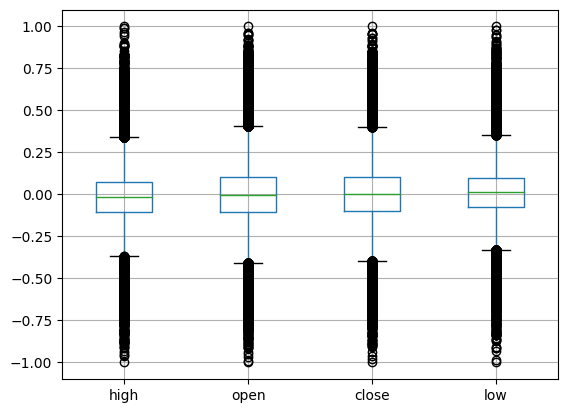

In [ ]:
# alpha=3
src_df.boxplot()

<Axes: >

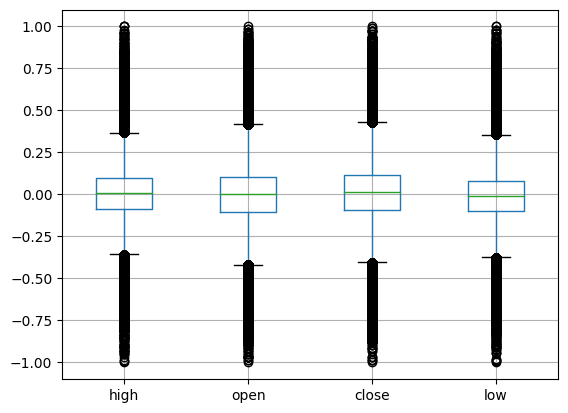

In [ ]:
# alpha=2
src_df.boxplot()

<Axes: >

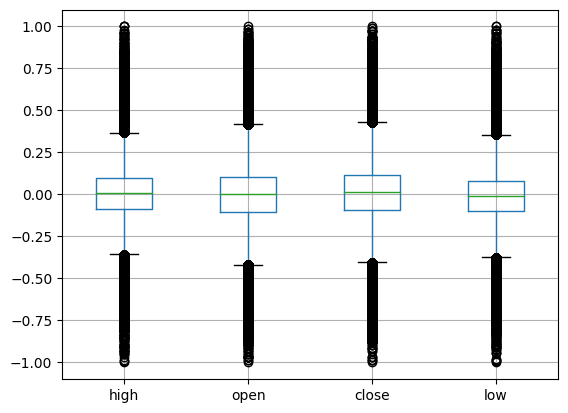

In [ ]:
# alpha=1
src_df.boxplot()

In [ ]:
import random

indices = random.choices(range(1, len(src_df)), k=3000)
indices.sort()

In [ ]:
src_df_lim = src_df.iloc[indices]

In [ ]:
cos = nn.CosineSimilarity(dim=1)
similarities = []
input2 = torch.tensor(src_df_lim.values)

for index in range(1, len(src_df_lim)):
  input1 = torch.tensor(src_df_lim.iloc[index: index+1].values)
  output = cos(input1, input2)
  similarity = output.cpu().detach().numpy()
  similarities.append(similarity)

In [ ]:
src_df_lim.iloc[10:30]

,high,open,close,low
time,,,,
2014-07-17 12:00:00,-0.039728,-0.020284,-0.015106,0.051546
2014-07-18 04:30:00,-0.141884,0.123732,-0.127895,0.138144
2014-07-18 06:00:00,0.103292,0.054767,0.079557,0.045361
2014-07-18 19:00:00,-0.048808,-0.060852,-0.055388,-0.107216
2014-07-18 20:30:00,-0.014756,0.050710,-0.033233,0.006186
2014-07-21 07:30:00,0.026107,-0.024341,0.121853,0.041237
2014-07-22 11:00:00,-0.125993,0.146045,-0.075529,0.051546
2014-07-22 17:30:00,0.069240,0.115619,-0.005035,0.109278
2014-07-23 19:00:00,-0.041998,-0.018256,0.051360,0.032990


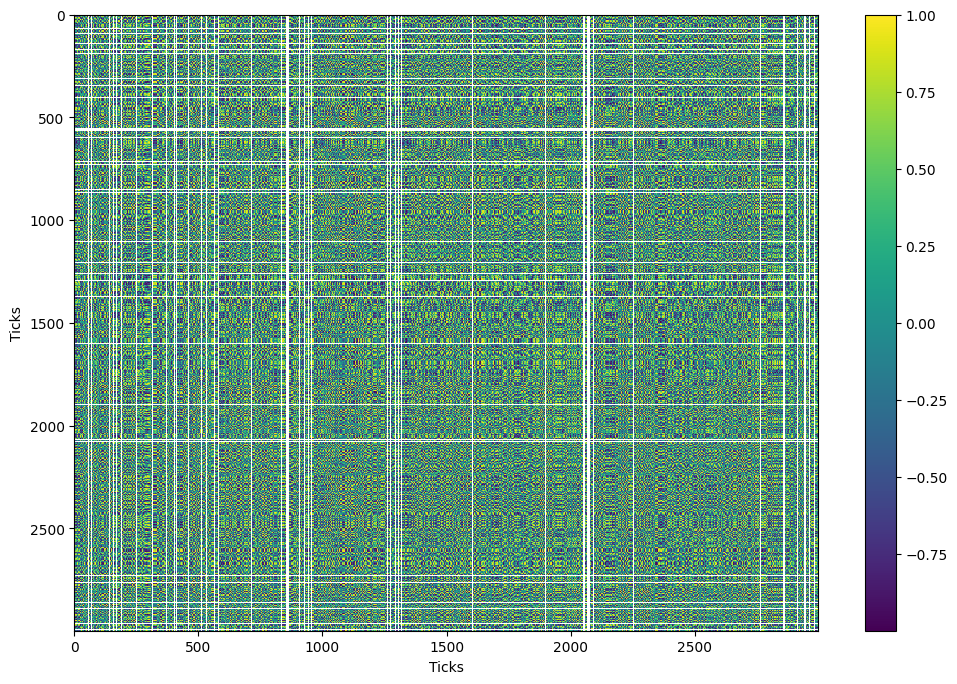

In [ ]:
import matplotlib.pyplot as plt

# alpha=3
plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('Ticks')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('Ticks')
plt.colorbar()
plt.show()

# Looks good, but long observation would have outliers

## Confirm diff token with standalization

In [ ]:
diff_p = fprocess.DiffPreProcess(columns=ohlc_column)
ohlc_pre_process = [diff_p]

standalization_p = fprocess.STDPreProcess(columns=ohlc_column, alpha=3)
processes = [*ohlc_pre_process, standalization_p]

In [ ]:
src_df = df[["open", "high", "low", "close"]].copy()

for process in processes:
  src_df = process(src_df)

array([[<Axes: title={'center': 'open'}>,
        <Axes: title={'center': 'high'}>],
       [<Axes: title={'center': 'low'}>,
        <Axes: title={'center': 'close'}>]], dtype=object)

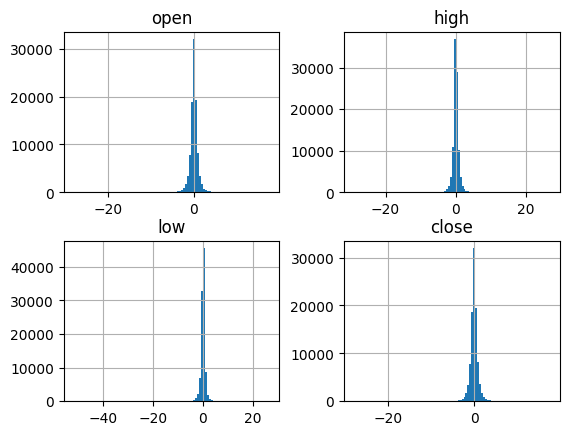

In [ ]:
# alpha=1
src_df.hist(bins=100)

array([[<Axes: title={'center': 'open'}>,
        <Axes: title={'center': 'high'}>],
       [<Axes: title={'center': 'low'}>,
        <Axes: title={'center': 'close'}>]], dtype=object)

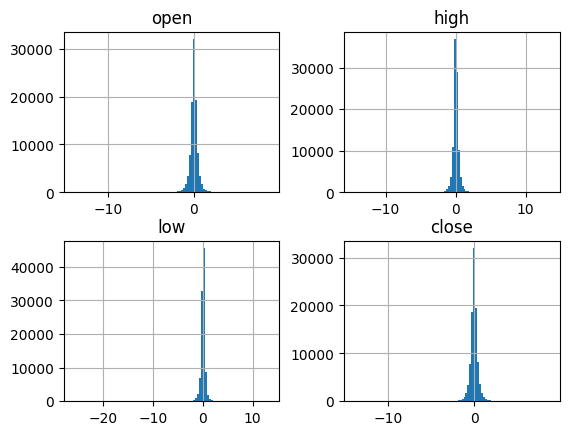

In [ ]:
# alpha=2
src_df.hist(bins=100)

In [ ]:
import random

indices = random.choices(range(1, len(src_df)), k=3000)
indices.sort()

src_df_lim = src_df.iloc[indices]
cos = nn.CosineSimilarity(dim=1)
similarities = []
input2 = torch.tensor(src_df_lim.values)

for index in range(1, len(src_df_lim)):
  input1 = torch.tensor(src_df_lim.iloc[index: index+1].values)
  output = cos(input1, input2)
  similarity = output.cpu().detach().numpy()
  similarities.append(similarity)

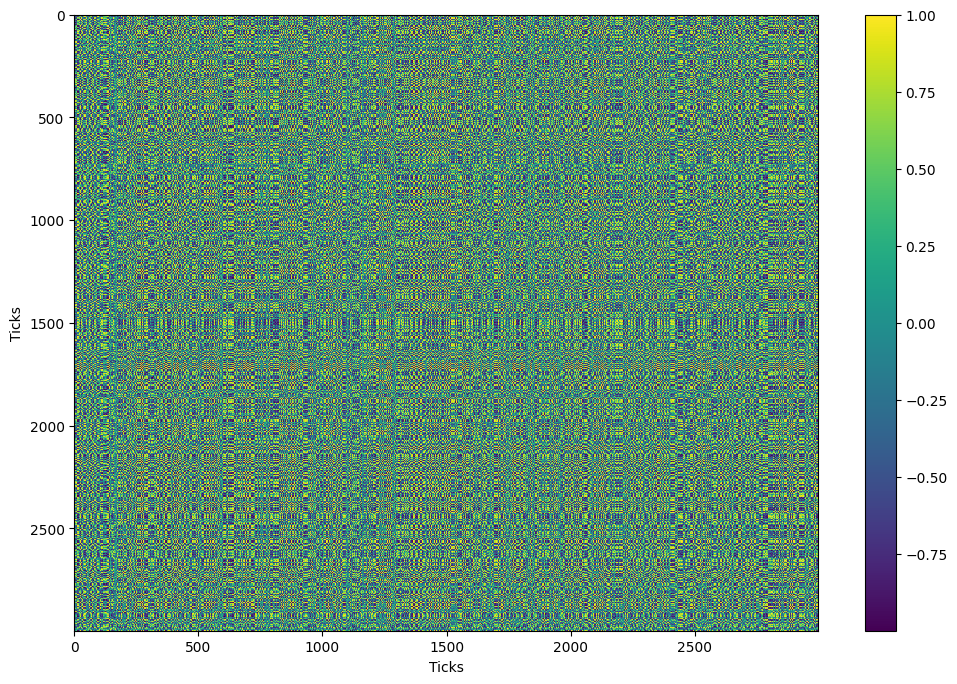

In [ ]:
import matplotlib.pyplot as plt


# alpha=3
plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('Ticks')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('Ticks')
plt.colorbar()
plt.show()

# Looks good, bud model would disturbed by outliers

## Data argument

Check if argumented data shows different aspects

### Combine multiple symbols

In [ ]:
import pandas as pd
import glob

files = glob.glob(f"{data_folder}/mt5_*_min30.zip")
files

['/content/drive/My Drive/Data/FX/mt5_USDJPY_min30.zip',
 '/content/drive/My Drive/Data/FX/mt5_CHFJPY_min30.zip',
 '/content/drive/My Drive/Data/FX/mt5_AUDJPY_min30.zip',
 '/content/drive/My Drive/Data/FX/mt5_AUDUSD_min30.zip',
 '/content/drive/My Drive/Data/FX/mt5_EURJPY_min30.zip',
 '/content/drive/My Drive/Data/FX/mt5_USDCHF_min30.zip',
 '/content/drive/My Drive/Data/FX/mt5_EURUSD_min30.zip']

In [ ]:
DFS = []
for file in files:
  df = pd.read_csv(file, index_col=0, parse_dates=True)
  DFS.append(df)

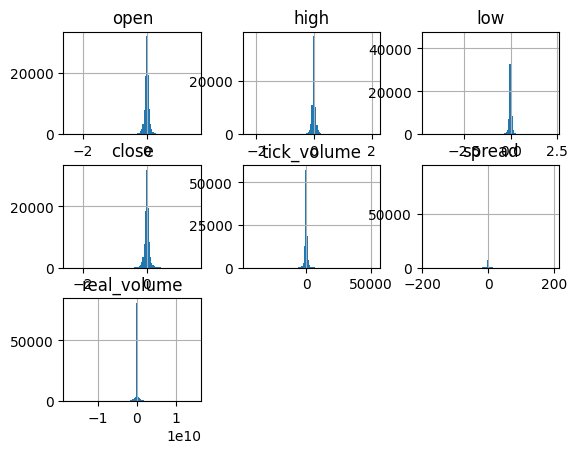

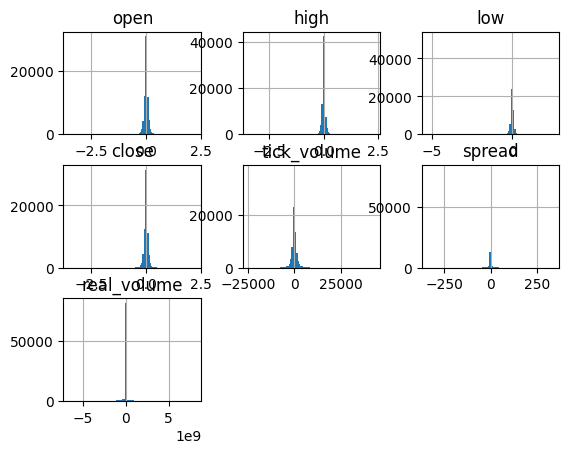

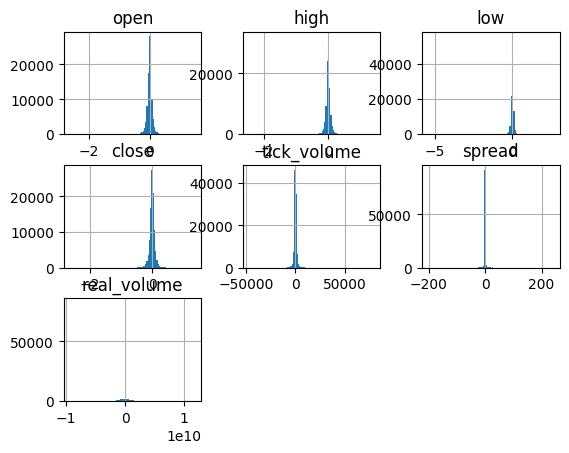

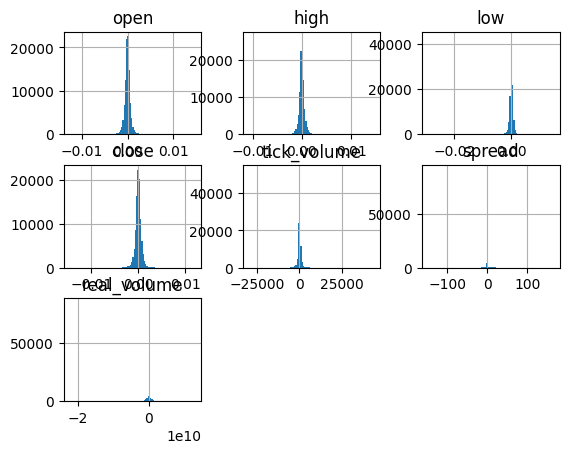

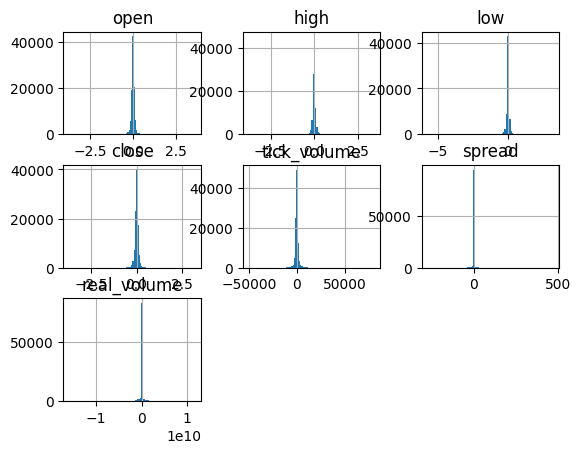

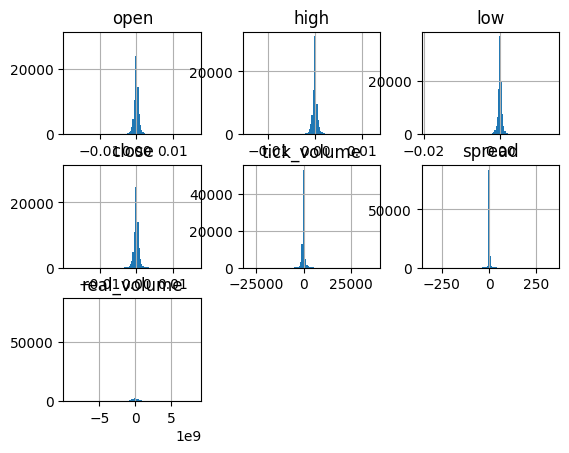

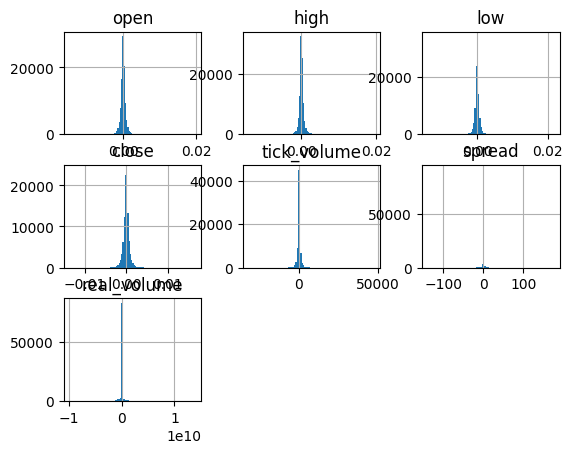

In [ ]:
for rolled_df in DFS:
  rolled_df.diff().hist(bins=100)

In [ ]:
import matplotlib.pyplot as plt
import random

DFS = []
columns = ohlc_column

for file in files:
  src_df = pd.read_csv(file, index_col=0, parse_dates=True)

  diff_p = fprocess.DiffPreProcess(columns=columns)
  ohlc_pre_process = [diff_p]

  standalization_p = fprocess.MinMaxPreProcess(columns=columns)
  processes = [*ohlc_pre_process, standalization_p]

  src_df = src_df[columns]

  for process in processes:
    src_df = process(src_df)

  indices = random.choices(range(1, len(src_df)), k=3000)
  indices.sort()
  src_df_lim = src_df.iloc[indices].copy()

  cos = nn.CosineSimilarity(dim=1)
  similarities = []
  input2 = torch.tensor(src_df_lim.values)

  for index in range(1, len(src_df_lim)):
    input1 = torch.tensor(src_df_lim.iloc[index: index+1].values)
    output = cos(input1, input2)
    similarity = output.cpu().detach().numpy()
    similarities.append(similarity)


  plt.figure(figsize=(12,8))
  plt.pcolormesh(similarities, cmap='viridis')
  plt.xlabel('Ticks')
  plt.xlim((0, len(similarities)))
  plt.ylim((len(similarities),0))
  plt.ylabel('Ticks')
  plt.colorbar()
  plt.show()
  DFS.append(src_df)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
for src_df in DFS:
  print('skew:', src_df.skew().values)
  print('curt:', src_df.kurtosis().values)

skew: [-4.76680581 -1.08251622 -1.10316985  0.1698781 ]
curt: [212.82098174  41.72337237  41.8575681   46.36204226]
skew: [-4.59276865 -1.27689181 -1.2706615  -0.85325163]
curt: [227.72446264  61.11957426  61.8927234   83.13314138]
skew: [-5.63091632 -1.2958034  -1.28115526 -0.42689441]
curt: [280.72152815  40.8871095   40.52840135  39.45895306]
skew: [-2.15886658 -0.07250304 -0.16262847  0.6027366 ]
curt: [95.92854107 19.55313246 19.62018331 23.98911054]
skew: [-4.43332124 -1.09315609 -1.09990395 -0.30608803]
curt: [207.7852171   63.02260733  58.51823433  80.38622526]
skew: [-0.92563966 -0.2363206  -0.18867572  0.21854575]
curt: [33.70928944 21.73051431 22.18947848 27.15631853]
skew: [-0.22952339  0.16867461  0.11220088  0.9568703 ]
curt: [40.88616986 25.42967896 22.4531892  38.26042539]


array([[<Axes: title={'center': 'low'}>,
        <Axes: title={'center': 'open'}>],
       [<Axes: title={'center': 'close'}>,
        <Axes: title={'center': 'high'}>]], dtype=object)

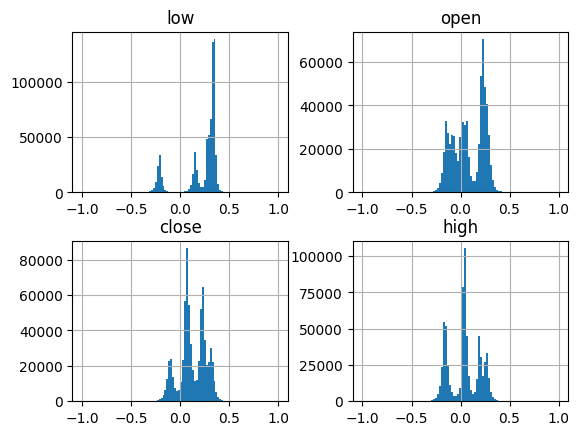

In [ ]:
# It may be not good to handle multiple symbols with min-max standalization
pd.concat(DFS).hist(bins=100)

In [ ]:
import matplotlib.pyplot as plt
import random

DFS = []
columns = ohlc_column

for file in files:
  src_df = pd.read_csv(file, index_col=0, parse_dates=True)

  diff_p = fprocess.DiffPreProcess(columns=columns)
  ohlc_pre_process = [diff_p]

  standalization_p = fprocess.STDPreProcess(columns=columns, alpha=3)
  processes = [*ohlc_pre_process, standalization_p]

  src_df = src_df[columns]

  for process in processes:
    src_df = process(src_df)

  indices = random.choices(range(1, len(src_df)), k=3000)
  indices.sort()
  src_df_lim = src_df.iloc[indices].copy()

  cos = nn.CosineSimilarity(dim=1)
  similarities = []
  input2 = torch.tensor(src_df_lim.values)

  for index in range(1, len(src_df_lim)):
    input1 = torch.tensor(src_df_lim.iloc[index: index+1].values)
    output = cos(input1, input2)
    similarity = output.cpu().detach().numpy()
    similarities.append(similarity)


  plt.figure(figsize=(12,8))
  plt.pcolormesh(similarities, cmap='viridis')
  plt.xlabel('Ticks')
  plt.xlim((0, len(similarities)))
  plt.ylim((len(similarities),0))
  plt.ylabel('Ticks')
  plt.colorbar()
  plt.show()
  DFS.append(src_df)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
for src_df in DFS:
  print('skew:', src_df.skew().values)
  print('kurt:', src_df.kurtosis().values)

skew: [-1.08251622  0.1698781  -4.76680581 -1.10316985]
curt: [ 41.72337237  46.36204226 212.82098174  41.8575681 ]
skew: [-1.27689181 -0.85325163 -4.59276865 -1.2706615 ]
curt: [ 61.11957426  83.13314138 227.72446264  61.8927234 ]
skew: [-1.2958034  -0.42689441 -5.63091632 -1.28115526]
curt: [ 40.8871095   39.45895306 280.72152815  40.52840135]
skew: [-0.07250304  0.6027366  -2.15886658 -0.16262847]
curt: [19.55313246 23.98911054 95.92854107 19.62018331]
skew: [-1.09315609 -0.30608803 -4.43332124 -1.09990395]
curt: [ 63.02260733  80.38622526 207.7852171   58.51823433]
skew: [-0.2363206   0.21854575 -0.92563966 -0.18867572]
curt: [21.73051431 27.15631853 33.70928944 22.18947848]
skew: [ 0.16867461  0.9568703  -0.22952339  0.11220088]
curt: [25.42967896 38.26042539 40.88616986 22.4531892 ]


In [ ]:
from numpy.lib.shape_base import kron
skews = None
kronurts = None

for src_df in DFS:
  skew = src_df.skew().values
  kronurt = src_df.kurtosis().values
  print('skew:', skew)
  print('kronurt:', kronurt)

  if skews is None:
    skews = skew
    kronurts = kronurt
  else:
    skews = np.vstack((skews, skew))
    kronurts = np.vstack((kronurts, kronurt))

skew: [-1.08251622  0.1698781  -4.76680581 -1.10316985]
curt: [ 41.72337237  46.36204226 212.82098174  41.8575681 ]
skew: [-1.27689181 -0.85325163 -4.59276865 -1.2706615 ]
curt: [ 61.11957426  83.13314138 227.72446264  61.8927234 ]
skew: [-1.2958034  -0.42689441 -5.63091632 -1.28115526]
curt: [ 40.8871095   39.45895306 280.72152815  40.52840135]
skew: [-0.07250304  0.6027366  -2.15886658 -0.16262847]
curt: [19.55313246 23.98911054 95.92854107 19.62018331]
skew: [-1.09315609 -0.30608803 -4.43332124 -1.09990395]
curt: [ 63.02260733  80.38622526 207.7852171   58.51823433]
skew: [-0.2363206   0.21854575 -0.92563966 -0.18867572]
curt: [21.73051431 27.15631853 33.70928944 22.18947848]
skew: [ 0.16867461  0.9568703  -0.22952339  0.11220088]
curt: [25.42967896 38.26042539 40.88616986 22.4531892 ]


In [ ]:
print('mean skew:', skews.mean(axis=0))
print('mean kurt:', kronurts.mean(axis=0))

mean skew: [-0.69835951  0.05168524 -3.24826309 -0.71342769]
mean curt: [ 39.06656989  48.39231663 157.08231286  38.15139688]


array([[<Axes: title={'center': 'open'}>,
        <Axes: title={'center': 'high'}>],
       [<Axes: title={'center': 'low'}>,
        <Axes: title={'center': 'close'}>]], dtype=object)

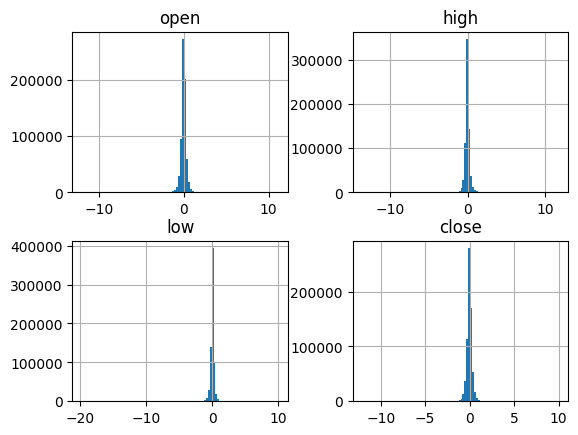

In [ ]:
combined_df = pd.concat(DFS)
combined_df.hist(bins=100)

In [ ]:
print('skew:', combined_df.skew().values)
print('kurt:', combined_df.kurtosis().values)

skew: [-0.69923145  0.05147871 -3.25281005 -0.71433334]
curt: [ 39.07108946  48.37869815 157.28616789  38.15485441]


### Combine different standalization initialized with different alpha

In [ ]:
import os
import pandas as pd

ohlc_column = ['open','high','low','close']
file_name = f"mt5_USDJPY_min30.zip"

file_path = os.path.join(data_folder, file_name)
file_path = os.path.abspath(file_path)
df = pd.read_csv(file_path, parse_dates=True, index_col=0)
df

,open,high,low,close,tick_volume,spread,real_volume
time,,,,,,,
2014-07-07 08:30:00,102.086,102.122,102.081,102.102,738,3,0
2014-07-07 09:00:00,102.102,102.146,102.098,102.113,1036,3,0
2014-07-07 09:30:00,102.113,102.115,102.042,102.044,865,3,0
2014-07-07 10:00:00,102.047,102.052,102.005,102.019,983,3,0
2014-07-07 10:30:00,102.017,102.025,101.918,101.941,1328,3,0
...,...,...,...,...,...,...,...
2022-08-12 21:30:00,133.461,133.506,133.439,133.484,1125,3,0
2022-08-12 22:00:00,133.484,133.530,133.437,133.475,1277,3,0
2022-08-12 22:30:00,133.475,133.486,133.433,133.483,1506,3,0


In [ ]:
DFS = []
ALPHAS = [1, 2, 3]

for alpha in ALPHAS:
  diff_p = fprocess.DiffPreProcess(columns=ohlc_column)
  ohlc_pre_process = [diff_p]

  standalization_p = fprocess.STDPreProcess(columns=ohlc_column, alpha=alpha)
  processes = [*ohlc_pre_process, standalization_p]

  src_df = df[["open", "high", "low", "close"]].copy()

  for process in processes:
    src_df = process(src_df)
  DFS.append(src_df)

In [ ]:
for src_df in DFS:
  print('skew:', src_df.skew().values)
  print('kurt:', src_df.kurtosis().values)

skew: [-1.08251622  0.1698781  -4.76680581 -1.10316985]
curt: [ 41.72337237  46.36204226 212.82098174  41.8575681 ]
skew: [-1.08251622  0.1698781  -4.76680581 -1.10316985]
curt: [ 41.72337237  46.36204226 212.82098174  41.8575681 ]
skew: [-1.08251622  0.1698781  -4.76680581 -1.10316985]
curt: [ 41.72337237  46.36204226 212.82098174  41.8575681 ]


array([[<Axes: title={'center': 'open'}>,
        <Axes: title={'center': 'high'}>],
       [<Axes: title={'center': 'low'}>,
        <Axes: title={'center': 'close'}>]], dtype=object)

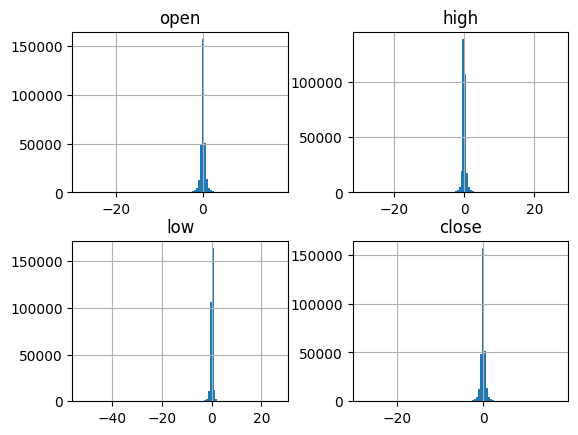

In [ ]:
combined_df = pd.concat(DFS)
combined_df.hist(bins=100)